In [180]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from scipy.optimize import curve_fit
import os
import json
# --- 全局字体设置 ---
plt.rcParams.update({
    'font.size': 18,
    'axes.titlesize': 22,
    'axes.labelsize': 20,
    'xtick.labelsize': 18,
    'ytick.labelsize': 18,
    'legend.fontsize': 12
})

# --- Fitting Functions ---
def power_func_time(t, B, alpha):
    """Power-law function for time-dependent fitting: B * t^(-alpha)."""
    return B * np.power(t, -alpha)

def exp_func_time(t, A, tau):
    """Exponential decay function for time-dependent fitting: A * exp(-t / tau)."""
    return A * np.exp(-t / tau)

def power_law_corr(x, A, beta):
    """Power-law function for parametric fitting: y = A * x^beta."""
    return A * np.power(x, beta)

def load_and_combine_data(directory_path):
    """
    Reads multiple correlation data files from a given directory, standardizes their
    column names, and merges them into a single Pandas DataFrame.

    This function acts as a flexible data-loading interface. To add a new data file,
    simply add an entry to the 'column_map' dictionary.

    Args:
        directory_path (str): The path to the directory containing the .dat files.

    Returns:
        pandas.DataFrame: A single DataFrame containing all merged data, with columns
                          like 't', 'DoubleCorrZ', 'ErrDoubleZ', etc. Returns None
                          if no data could be loaded.
    """
    # --- This map is the core of the interface ---
    # It links new filenames to the old, standardized DataFrame column names.
    # To add a new file (e.g., height_t_corr.dat), just add a new line here.
    column_map = {
        # 'new_filename.dat': {'col_in_file': 'standard_col_name', ...}
        'szsz_t_corr.dat':   {'t': 't', 'Avg': 'DoubleCorrZ', 'Err': 'ErrDoubleZ'},
        'oo_t_corr.dat':     {'t': 't', 'Avg': 'DoubleCorrO', 'Err': 'ErrDoubleO'},
        'sz_autocorr.dat':   {'t': 't', 'Avg': 'Sz_Autocorr_Avg',   'Err': 'Sz_Autocorr_Err'},
        'height_t_corr.dat': {'t': 't', 'Avg': 'HH_t_Avg',       'Err': 'HH_t_Err'},
        'height_diffusion.dat': {'t': 't', 'Avg': 'Height_Diff_A_Avg', 'Err': 'Height_Diff_A_Err'},
        # 'final_grand_average_equal.dat': {'r': 'r', 'Avg': 'DoubleCorrZ', 'Err': 'ErrDoubleZ', 'Avg': 'DoubleCorrO', 'Err': 'ErrDoubleO'},
        'final_grand_average_time.dat': {'t': 't', 'Avg1': 'DoubleCorrZ', 'Err1': 'ErrDoubleZ', 'Avg': 'DoubleCorrO', 'Err': 'ErrDoubleO'},
        # Add other time-correlations here if needed
        # 'szsz_r_corr.dat': {'r': 'r', 'Avg': 'CorrZ_r', 'Err': 'ErrCorrZ_r'},
    }

    list_of_dfs = []
    base_column = None # Will be 't' or 'r'

    for filename, name_map in column_map.items():
        full_path = os.path.join(directory_path, filename)
        try:
            # Read the individual data file
            temp_df = pd.read_csv(full_path, sep='\s+')
            
            # The first successfully read file determines the base column ('t' or 'r')
            if base_column is None:
                if 't' in temp_df.columns:
                    base_column = 't'
                elif 'r' in temp_df.columns:
                    base_column = 'r'
            
            # Rename columns to the standard format
            temp_df.rename(columns=name_map, inplace=True)
            
            # Keep only the standardized columns
            list_of_dfs.append(temp_df[list(name_map.values())])

        except FileNotFoundError:
            # It's okay if some files are missing, just skip them.
            # print(f"Info: File not found '{full_path}', skipping.")
            pass
        except Exception as e:
            print(f"Error reading file {full_path}: {e}")

    if not list_of_dfs:
        print(f"Warning: No data files found in {directory_path}")
        return None

    # --- Merge all the individual DataFrames into one ---
    # Start with the first DataFrame in the list
    combined_df = list_of_dfs[0]
    
    # Iteratively merge the rest of the DataFrames
    for df_to_merge in list_of_dfs[1:]:
        combined_df = pd.merge(combined_df, df_to_merge, on=base_column, how='outer')

    # Sort by the base column for consistency
    combined_df.sort_values(by=base_column, inplace=True)
    
    return combined_df


In [214]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
import os

# --- Helper functions for fitting (can be defined globally) ---
def power_func_time(t, a, b):
    """Power law: a * t**(-b)"""
    return a * t**(-b)

def exp_func_time(t, a, tau):
    """Exponential decay: a * exp(-t/tau)"""
    return a * np.exp(-t / tau)

def power_law_corr(C_z, A, beta):
    """Power law for parametric plot: A * C_z**beta"""
    return A * C_z**beta

# --- REFACTORED FUNCTION 1: DATA LOADING ---
def load_and_process_data(datasets):
    """
    Loads all data from files based on the dataset configurations.

    Args:
        datasets (list): A list of dictionaries, each specifying L, S, T, etc.

    Returns:
        dict: A dictionary where keys are system sizes (L) and values are
              the corresponding pandas DataFrames.
    """
    processed_data = {}
    print("--- Starting Data Loading ---")
    for dataset in datasets:
        L, S = dataset["L"], dataset.get("S", 1)
        # Construct the file path
        file_path = f"./puredata/data/L{L}_S{S}_T{dataset['T']}_Tthermal{dataset['Tthm']}/final_grand_average_time.dat"
        
        try:
            # Load data directly into the dictionary, keyed by L
            df = pd.read_csv(file_path, sep='\s+')
            processed_data[L] = df
            print(f"  Successfully loaded data for L={L}, S={S}.")
        except FileNotFoundError:
            print(f"  Warning: Data file not found for L={L}, S={S}. Skipping.")
            pass # Silently skip if a file doesn't exist
        except Exception as e:
            print(f"  An error occurred loading L={L}, S={S}: {e}")
            pass
            
    print("--- Data Loading Complete ---\n")
    return processed_data


# --- REFACTORED FUNCTION 2: COLLAPSE PLOT ---
# --- REFACTORED FUNCTION 2: COLLAPSE PLOT (Corrected for errorbar return value) ---
# --- REFACTORED FUNCTION 2: COLLAPSE PLOT (Legend only for Fits) ---
# --- REFACTORED FUNCTION 2: COLLAPSE PLOT (Title includes S value) ---
def plot_data_collapse(
    processed_data,
    datasets,
    plot_configs,
    z,
    output_filename,
    axis_limits=None,
    axis_type = None,
    ncols=1
):
    """
    Creates data collapse plots where the title includes the S value and
    only the fit lines appear in the legend.
    """
    num_subplots = len(plot_configs)
    nrows = (num_subplots + ncols - 1) // ncols
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(10 * ncols, 7 * nrows), squeeze=False)
    axes = axes.flatten()

    all_scaled_data = {}
    fitted_taus = {}
    L_to_S_map = {d['L']: d.get('S', 1) for d in datasets}
    L_to_dataset_map = {d['L']: d for d in datasets}
    
    # ### NEW: Get the S value for the title ###
    # Assuming all datasets in this run have the same S value
    S_val = datasets[0].get('S', 'N/A') if datasets else 'N/A'

    # This dictionary now only stores the line object to retrieve its color later
    plot_handles = {i: {} for i in range(num_subplots)}

    # --- 1. Data Scaling and Initial Plotting ---
    for L, df in processed_data.items():
        dataset = L_to_dataset_map.get(L)
        if not dataset:
            continue

        t = df["t"].values
        t_scaled = t / (L ** z)
        all_scaled_data[L] = {'t_scaled': t_scaled}

        for i, config in enumerate(plot_configs):
            ax = axes[i]
            data_col, err_col = config['data_col'], config.get('err_col')
            
            if data_col not in df.columns: continue

            # ... (scaling factor calculation remains the same)
            scaling_exp = config.get('scaling_exponent', 0)
            log_power = config.get('log_power', 0)
            coef = config.get("coef", 1.0)
            scaling_factor = (L ** scaling_exp) / (np.log(L) ** log_power if L > 1 else 1) * coef
            scaled_y = df[data_col].values * scaling_factor
            all_scaled_data[L][data_col] = scaled_y
            if 'fit_configs' in config: label = None
            else: label = f"L={L}"
            if dataset.get("plot_errorbars", False) and err_col and err_col in df.columns:
                scaled_err = df[err_col].values * scaling_factor
                line = ax.errorbar(t_scaled, scaled_y, yerr=scaled_err, fmt='o', markersize=3, capsize=3, label=label)[0]
            else:
                line, = ax.plot(t_scaled, scaled_y, 'o', markersize=3, label=label)
            
            plot_handles[i][L] = line

    # --- 2. Fitting and Finalizing Plots ---
    for i, config in enumerate(plot_configs):
        ax = axes[i]
        # print(f"\n--- Fitting for plot of {config['data_col']} ---")
        use_semilogy = any(fit[2] == 'exp' for fit in config.get('fit_configs', []) if len(fit) == 3)

        if 'fit_configs' in config:
            for target_L, (t_min, t_max), fit_type in config.get('fit_configs', []):
                if target_L not in all_scaled_data: continue
                
                # ... (data masking and setup remains the same)
                t_s = all_scaled_data[target_L]['t_scaled']
                y_s = all_scaled_data[target_L][config['data_col']]
                mask = (t_s >= t_min) & (t_s <= t_max) & (y_s > 0)
                if not np.any(mask): continue
                
                p0_guess, fit_func, p_idx, t_fit_range = (None, None, None, None)
                if fit_type == 'power':
                    fit_func, p_idx = power_func_time, 1
                    p0_guess = [y_s[mask].max(), 1.0]
                    t_fit_range = np.logspace(np.log10(max(1e-9, t_s[mask].min()))-1.5, np.log10(t_s[mask].max())+2, 200)
                elif fit_type == 'exp':
                    fit_func, p_idx = exp_func_time, 1
                    p0_guess = [y_s[mask].max(), (t_s[mask].max() - t_s[mask].min()) / 2]
                    t_fit_range = np.linspace(t_s[mask].min(), t_s[mask].max(), 200)
                
                if fit_func:
                    try:
                        popt, _ = curve_fit(fit_func, t_s[mask], y_s[mask], p0=p0_guess)
                        
                        line_color = plot_handles[i][target_L].get_color()
                        
                        fit_label_suffix = f"[{t_min:.1f}-{t_max:.1f}]"
                        if fit_type == 'power':
                            fit_value_str = f"$t^{{{-popt[p_idx]:.2f}}}$"
                        elif fit_type == 'exp':
                            fit_value_str = f"$\\tau={popt[p_idx]:.2f}$"

                        full_fit_label = f"L={target_L} {fit_value_str}{fit_label_suffix}"

                        ax.plot(t_fit_range, fit_func(t_fit_range, *popt), 
                                linestyle='--', color=line_color,
                                label=full_fit_label)

                    except RuntimeError:
                        print(f"  Warning: Fit failed for L={target_L} in range [{t_min}, {t_max}].")
        
        # ... (axis setup remains the same)
        if use_semilogy: ax.set_xscale('linear'); ax.set_yscale('log')
        else: ax.set_xscale('log'); ax.set_yscale('log')
        if axis_type: ax.set_xscale(axis_type[0]); ax.set_yscale(axis_type[1])
      
        ax.set_xlabel(r"Scaled Time $t/L^z$" if z != 0 else r"Time $t$")
        ax.set_ylabel(rf"${config['label']}$" if config.get('scaling_exponent', 0) == 0 else rf"${config['label']} \cdot L^{{{config.get('scaling_exponent', 0)}}}/(ln L)^{{{config.get('log_power', 0)}}}$")
        
        # ### MODIFICATION: Add S value to the title ###
        ax.set_title(f"${config['label']}$ (z = {z}, S = {S_val})")
        
        ax.legend(loc='best', fontsize='small')
        ax.grid(True, which="both", ls="--")

        if axis_limits and f'ax{i+1}' in axis_limits:
            if 'xlim' in axis_limits[f'ax{i+1}']: ax.set_xlim(axis_limits[f'ax{i+1}']['xlim'])
            if 'ylim' in axis_limits[f'ax{i+1}']: ax.set_ylim(axis_limits[f'ax{i+1}']['ylim'])

    plt.tight_layout(pad=2.0)
    plt.savefig(output_filename)
    print(f"\nCollapse plot saved as {output_filename}")
    plt.show()
    return fitted_taus
#


# --- REFACTORED FUNCTION 3: PARAMETRIC PLOT (Optimized Labels) ---
def plot_multi_parametric(
    processed_data,
    x_col,
    y_cols,
    output_filename,
    fit_config=None,
    plot_title="Parametric Plot",
    x_label=None,
    y_label=None
):
    """
    Creates a generalized parametric plot where data points and fit lines
    share colors, and only fit lines appear in the legend.
    """
    fig, ax = plt.subplots(figsize=(10, 7))
    
    # Dictionary to store line objects to retrieve their colors later
    plot_handles = {}

    print(f"\n--- Generating Parametric Plot: {y_cols} vs. {x_col} ---")
    
    # We need a color cycle that doesn't reset for each y_col
    prop_cycler = plt.rcParams['axes.prop_cycle']
    colors = prop_cycler.by_key()['color']
    color_idx = 0

    for y_col in y_cols:
        # --- 1. Plot Raw Data ---
        for L, df in processed_data.items():
            if x_col in df.columns and y_col in df.columns:
                mask = (df[x_col] > 0) & (df[y_col] > 0)
                if not np.any(mask): continue
                
                # Assign a unique color for each L, y_col pair
                color = colors[color_idx % len(colors)]
                color_idx += 1

                # ### MODIFICATION: Plot points WITHOUT a label ###
                line, = ax.plot(df[x_col][mask], df[y_col][mask], 'o', markersize=3, label=None, color=color)
                
                # Store the line handle, keyed by a tuple of (L, y_col)
                plot_handles[(L, y_col)] = line
            else:
                print(f"  Warning: Columns '{x_col}' or '{y_col}' not found for L={L}. Skipping.")

        # --- 2. Perform Fitting ---
        if fit_config:
            print(f"--- Performing parametric fitting for {y_col}... ---")
            for target_L, (x_min, x_max) in fit_config:
                if target_L not in processed_data:
                    print(f"  Warning: L={target_L} not in processed data. Skipping fit.")
                    continue

                df_fit = processed_data[target_L]
                # Ensure columns exist for fitting
                if not (x_col in df_fit.columns and y_col in df_fit.columns):
                    continue

                fit_mask = (df_fit[x_col] >= x_min) & (df_fit[x_col] <= x_max)
                
                if np.any(fit_mask):
                    try:
                        popt, _ = curve_fit(power_law_corr, df_fit[x_col][fit_mask], df_fit[y_col][fit_mask], p0=[1, 1])
                        A_fit, beta_fit = popt
                        
                        x_fit_range = np.logspace(np.log10(x_min) - 2, np.log10(x_max) + 1, 100)
                        y_fit_range = power_law_corr(x_fit_range, A_fit, beta_fit)
                        
                        # ### MODIFICATION: Get color from the stored handle ###
                        data_line = plot_handles.get((target_L, y_col))
                        if not data_line:
                            continue # Skip if no data was plotted for this combo
                        line_color = data_line.get_color()

                        # Create the full descriptive label
                        label = f'L={target_L} ({y_col.split("_")[0]}): $y \\propto x^{{{beta_fit:.2f}}}$'
                        
                        # Plot the fit line with the correct color and label
                        ax.plot(x_fit_range, y_fit_range, '--', label=label, color=line_color)
                        print(f"  Fit for L={target_L}, {y_col} complete. Exponent = {beta_fit:.4f}")
                    except RuntimeError:
                        print(f"  Error: Power-law fit failed for L={target_L} on {y_col}.")
                else:
                    print(f"  Warning: No data to fit for L={target_L} on {y_col}.")
        
    # --- 3. Finalize Plot ---
    ax.set_xscale('log')
    ax.set_yscale('log')
    ax.set_xlabel(x_label if x_label else f"Raw ${x_col}$")
    ax.set_ylabel(y_label if y_label else "Various Correlations")
    ax.set_title(plot_title)
    
    # ### MODIFICATION: Simplified legend call ###
    # Matplotlib will now automatically create a legend for the fit lines only
    ax.legend(fontsize='small')
    ax.grid(True, which="both", ls="--")
    
    plt.tight_layout()
    plt.savefig(output_filename)
    print(f"\nParametric plot saved as {output_filename}")
    plt.show()



--- Starting Data Loading ---
  Successfully loaded data for L=10, S=1.
  Successfully loaded data for L=20, S=1.
  Successfully loaded data for L=30, S=1.
  Successfully loaded data for L=50, S=1.
  Successfully loaded data for L=80, S=1.
  Successfully loaded data for L=120, S=1.
--- Data Loading Complete ---


Collapse plot saved as fig/S1_Corr.png


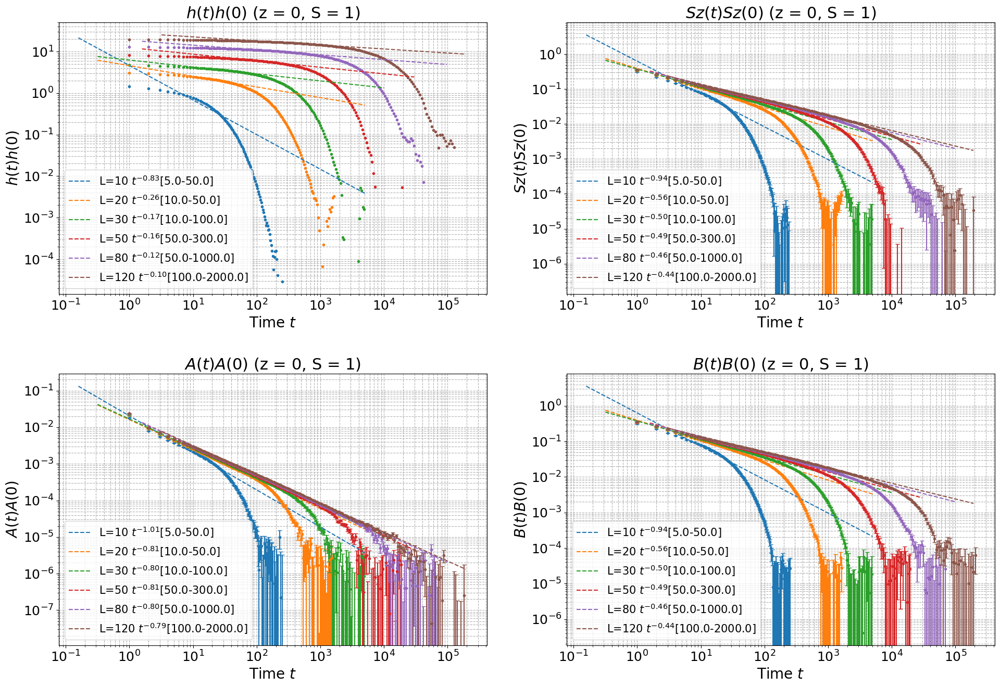

Fitted Taus: {}

Collapse plot saved as fig/S1_OQ.png


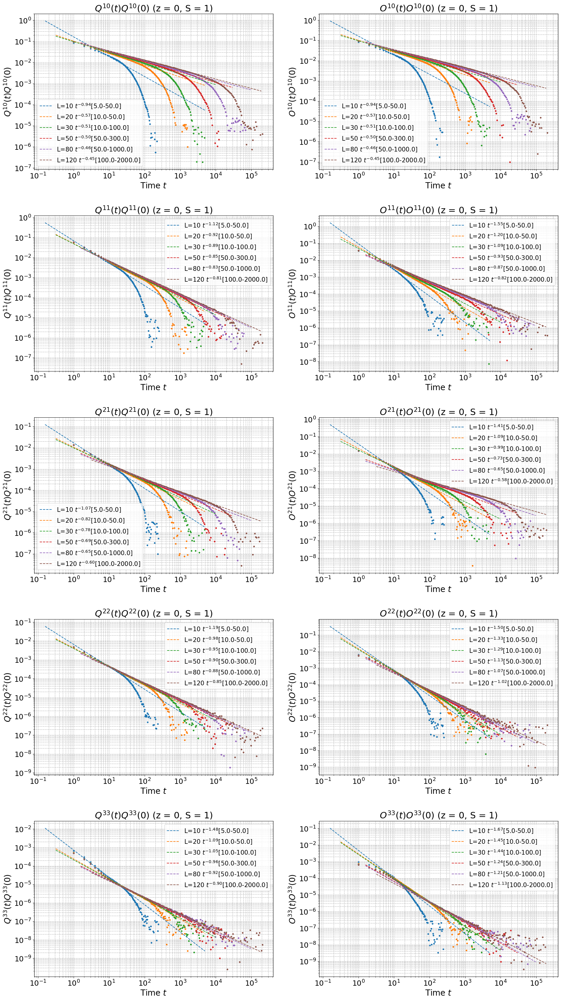

--- Starting Data Loading ---
  Successfully loaded data for L=10, S=2.
  Successfully loaded data for L=20, S=2.
  Successfully loaded data for L=30, S=2.
  Successfully loaded data for L=50, S=2.
  Successfully loaded data for L=80, S=2.
  Successfully loaded data for L=120, S=2.
--- Data Loading Complete ---


Collapse plot saved as fig/S2_Corr.png


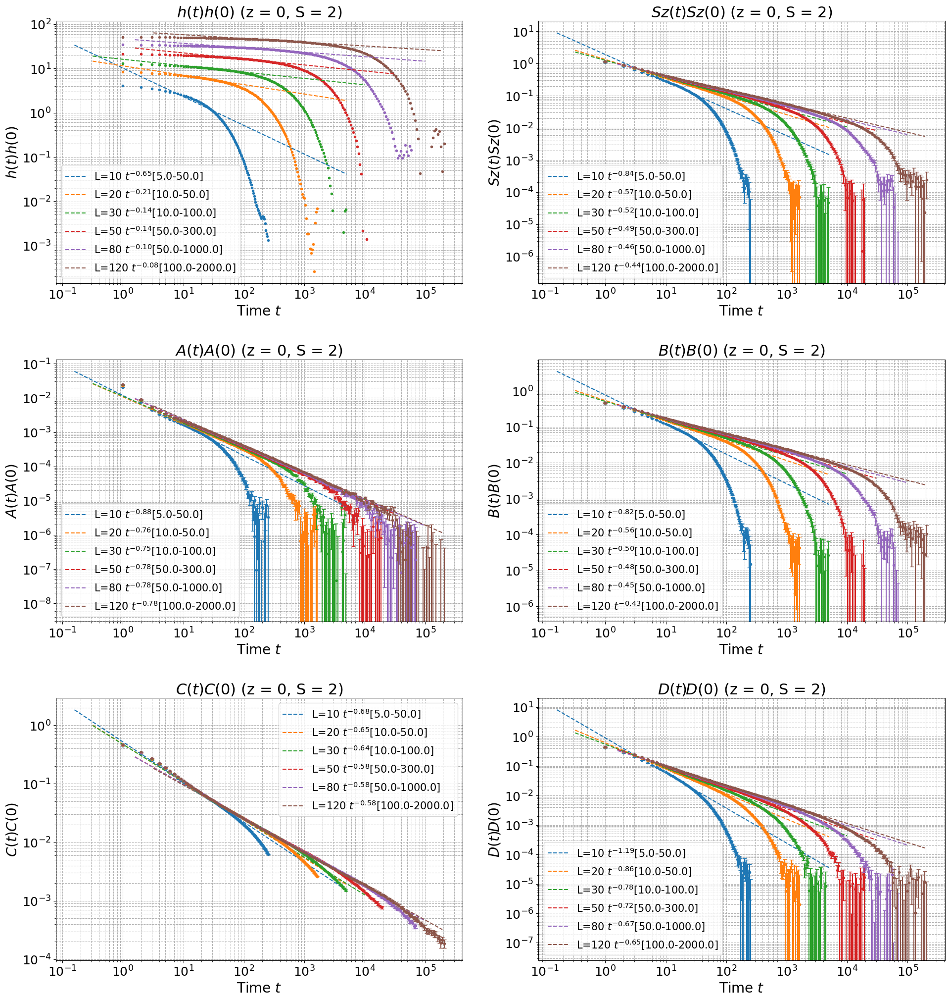

Fitted Taus: {}

Collapse plot saved as fig/S2_OQ.png


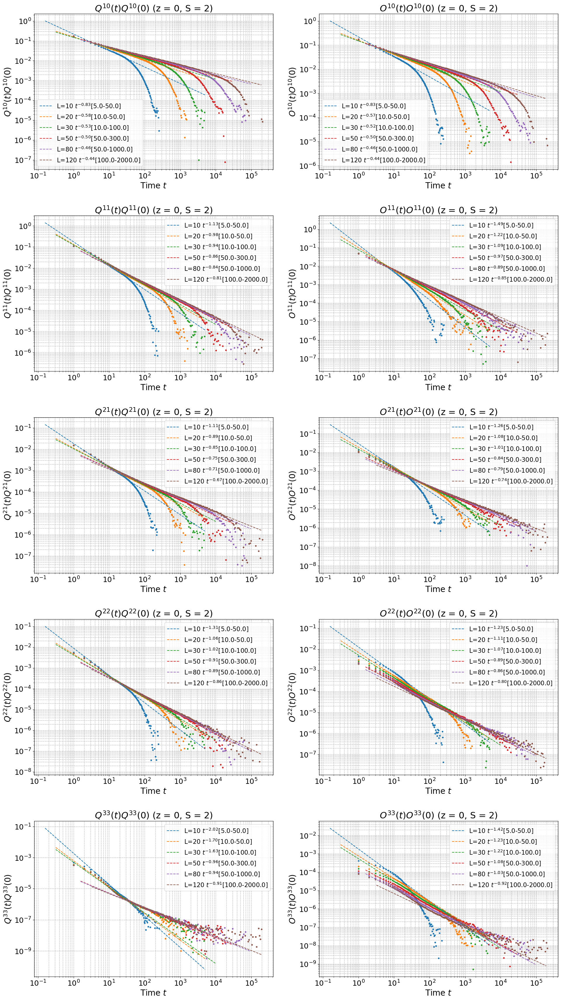

--- Starting Data Loading ---
  Successfully loaded data for L=10, S=5.
  Successfully loaded data for L=20, S=5.
  Successfully loaded data for L=30, S=5.
  Successfully loaded data for L=50, S=5.
  Successfully loaded data for L=80, S=5.
  Successfully loaded data for L=120, S=5.
--- Data Loading Complete ---


Collapse plot saved as fig/S5_Corr.png


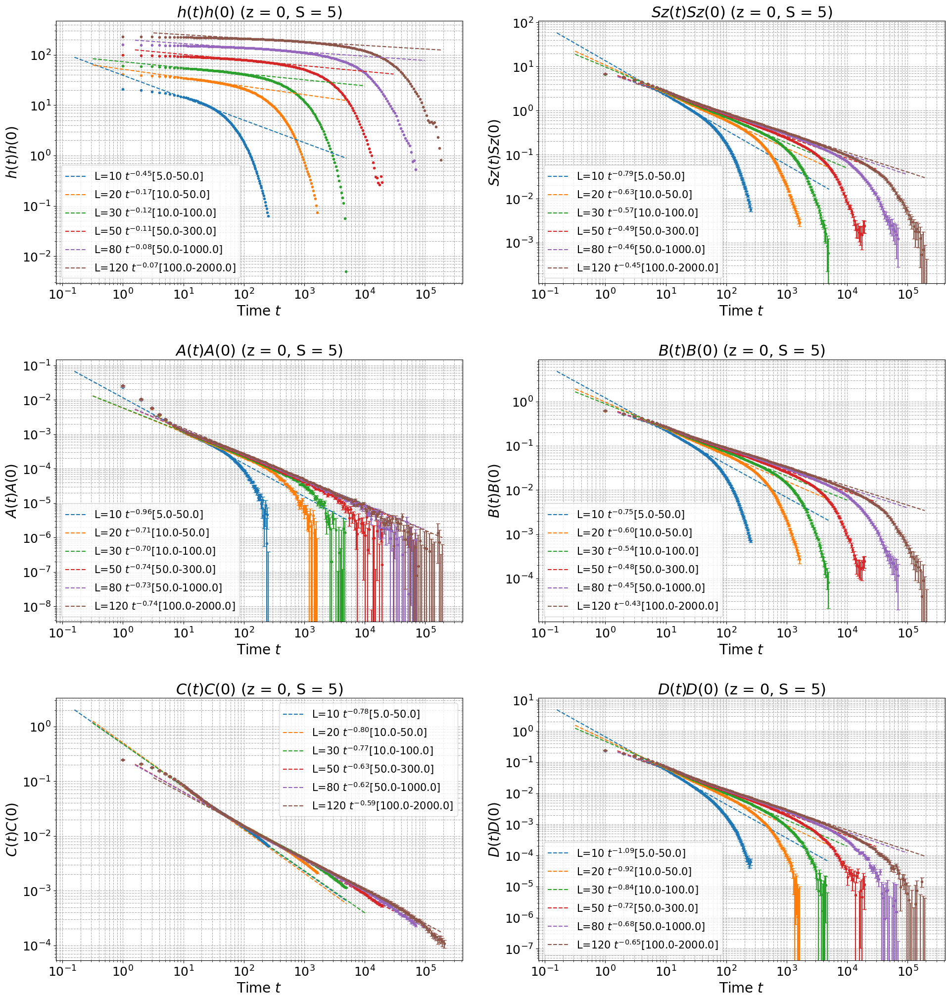

Fitted Taus: {}

Collapse plot saved as fig/S5_OQ.png


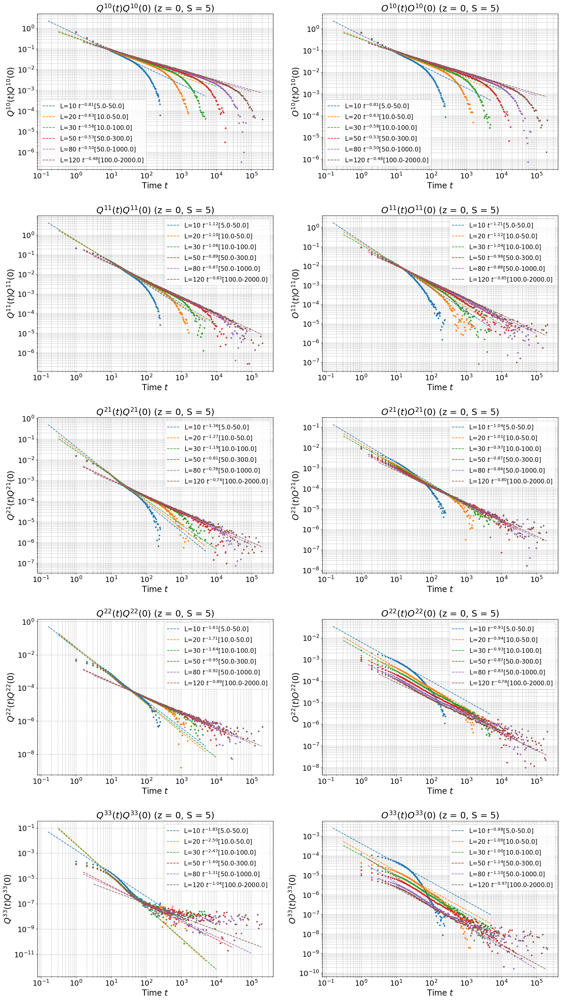

In [ ]:
# --- Main execution block ---
if __name__ == '__main__':
    output_dir = "fig"
    os.makedirs(output_dir, exist_ok=True)
    
    Z_EXPONENT = 0
    for S_VALUE in [1,2,5]:
        datasets_to_run = [
            {"L": 10, "S": S_VALUE, "T": 10000000, "Tthm": 10000000, "plot_errorbars": True},
            {"L": 20, "S": S_VALUE, "T":  10000000, "Tthm": 10000000, "plot_errorbars": True},
            {"L": 30, "S": S_VALUE, "T":  10000000, "Tthm": 10000000, "plot_errorbars": True},
            {"L": 50, "S": S_VALUE, "T":  10000000, "Tthm": 10000000, "plot_errorbars": True},
            {"L": 80, "S": S_VALUE, "T":  10000000, "Tthm": 10000000, "plot_errorbars": True},
            {"L": 100, "S": S_VALUE, "T": 10000000, "Tthm": 10000000, "plot_errorbars": True},
            {"L": 120, "S": S_VALUE, "T": 10000000, "Tthm": 10000000, "plot_errorbars": True},
        ]

        # STEP 1: Load all data for the current S_VALUE once.
        all_data = load_and_process_data(datasets_to_run)
        
        # If no data was loaded, skip to the next S_VALUE
        if not all_data:
            print(f"No data found for S={S_VALUE}, skipping plot generation.")
            continue

        # STEP 2: Generate the data collapse plot using the loaded data.
        FitConfigs = [   # Fits for this specific plot
            (10, (5, 50), 'power'),
            (20, (10, 50), 'power'),
            (30, (10, 100), 'power'),
            (50, (50, 300), 'power'),
            (80, (50, 1000), 'power'),
            # (100, (50, 500), 'power'),
            (120, (100, 2000), 'power'),
            # (1000, (10000, 20000), 'exp'),
            ]
        plot_configs_collapse = [
            {'data_col': 'HH_t_Avg', 'err_col': 'HH_t_Err', 'label': 'h(t)h(0)', 'fit_configs': FitConfigs},
            {'data_col': 'SzSz_t_Avg', 'err_col': 'SzSz_t_Err', 'label': 'Sz(t)Sz(0)', 'fit_configs': FitConfigs},
            {'data_col': 'AA_t_Avg', 'err_col': 'AA_t_Err', 'label': 'A(t)A(0)', 'fit_configs': FitConfigs},
            {'data_col': 'BB_t_Avg', 'err_col': 'BB_t_Err', 'label': 'B(t)B(0)', 'fit_configs': FitConfigs},
                
        ]
        if S_VALUE > 1:
            plot_configs_collapse.extend([
                {'data_col': 'CC_t_Avg', 'err_col': 'CC_t_Err', 'label': 'C(t)C(0)', 'fit_configs': FitConfigs},
                {'data_col': 'DD_t_Avg', 'err_col': 'DD_t_Err', 'label': 'D(t)D(0)', 'fit_configs': FitConfigs},
            ])

        tau_results = plot_data_collapse(
            processed_data=all_data,
            datasets=datasets_to_run,
            plot_configs=plot_configs_collapse,
            z=Z_EXPONENT,
            output_filename=os.path.join(output_dir, f"S{S_VALUE}_Corr.png"),
            ncols=2 # Example of using 2 columns
        )
        print("Fitted Taus:", tau_results)

        # # STEP 3: Generate a parametric plot using the same loaded data.
        # # This example plots SzSz_t_Avg vs h_t_Avg, but you can choose any columns.
        # plot_parametric(
        #     processed_data=all_data,
        #     x_col='h_t_Avg',
        #     y_col='SzSz_t_Avg',
        #     output_filename=os.path.join(output_dir, f"S{S_VALUE}_parametric_Sz_vs_h.png"),
        #     plot_title=f"Parametric Plot for S={S_VALUE}",
        #     x_label=r'Correlation $C_{h}(t)$',
        #     y_label=r'Correlation $C_{Sz}(t)$',
        #     fit_config=[(120, (1e-3, 1e-1))] # Example: fit for L=120 in a specific x-range
        # )

        plot_configs_2 = [
                {
                'data_col': 'qm1n0m1n0_t_Avg',
                'err_col': 'qm1n0m1n0_t_Err ',
                'label': 'Q^{10}(t)Q^{10}(0)',
                'scaling_exponent': 0, # Formerly DeltaZ2
                'log_power': 0,        # Formerly log_power_Z
                'fit_configs': FitConfigs
            },
            {
                'data_col': 'om1n0m1n0_t_Avg',
                'err_col': 'om1n0m1n0_t_Err ',
                'label': 'O^{10}(t)O^{10}(0)',
                'scaling_exponent': 0, # Formerly DeltaZ2
                'log_power': 0,        # Formerly log_power_Z
                'fit_configs': FitConfigs
            },
            {
                'data_col': 'qm1n1m1n1_t_Avg',
                'err_col': 'qm1n1m1n1_t_Err ',
                'label': 'Q^{11}(t)Q^{11}(0)',
                'scaling_exponent': 0, # Formerly DeltaZ2
                'log_power': 0,        # Formerly log_power_Z
                'fit_configs': FitConfigs
            },
            {
                'data_col': 'om1n1m1n1_t_Avg',
                'err_col': 'om1n1m1n1_t_Err ',
                'label': 'O^{11}(t)O^{11}(0)',
                'scaling_exponent': 0, # Formerly DeltaZ2
                'log_power': 0,        # Formerly log_power_Z
                'fit_configs': FitConfigs
            },
                        {
                'data_col': 'qm2n1m2n1_t_Avg',
                'err_col': 'qm2n1m2n1_t_Err ',
                'label': 'Q^{21}(t)Q^{21}(0)',
                'scaling_exponent': 0, # Formerly DeltaZ2
                'log_power': 0,        # Formerly log_power_Z
                'fit_configs': FitConfigs
            },
            {
                'data_col': 'om2n1m2n1_t_Avg',
                'err_col': 'om2n1m2n1_t_Err ',
                'label': 'O^{21}(t)O^{21}(0)',
                'scaling_exponent': 0, # Formerly DeltaZ2
                'log_power': 0,        # Formerly log_power_Z
                'fit_configs': FitConfigs
            },
            {
                'data_col': 'qm2n2m2n2_t_Avg',
                'err_col': 'qm2n2m2n2_t_Err ',
                'label': 'Q^{22}(t)Q^{22}(0)',
                'scaling_exponent': 0, # Formerly DeltaZ2
                'log_power': 0,        # Formerly log_power_Z
                'fit_configs': FitConfigs
            },
            {
                'data_col': 'om2n2m2n2_t_Avg',
                'err_col': 'om2n2m2n2_t_Err ',
                'label': 'O^{22}(t)O^{22}(0)',
                'scaling_exponent': 0, # Formerly DeltaZ2
                'log_power': 0,        # Formerly log_power_Z
                'fit_configs': FitConfigs
            },

            {
                'data_col': 'qm3n3m3n3_t_Avg',
                'err_col': 'qm3n3m3n3_t_Err ',
                'label': 'Q^{33}(t)Q^{33}(0)',
                'scaling_exponent': 0, # Formerly DeltaZ2
                'log_power': 0,        # Formerly log_power_Z
                'fit_configs': FitConfigs
            },
            {
                'data_col': 'om3n3m3n3_t_Avg',
                'err_col': 'om3n3m3n3_t_Err ',
                'label': 'O^{33}(t)O^{33}(0)',
                'scaling_exponent': 0, # Formerly DeltaZ2
                'log_power': 0,        # Formerly log_power_Z
                'fit_configs': FitConfigs
            },
            
        ]
        tau_results = plot_data_collapse(
            processed_data=all_data,
            datasets=datasets_to_run,
            plot_configs=plot_configs_2,
            z=Z_EXPONENT,
            output_filename=os.path.join(output_dir, f"S{S_VALUE}_OQ.png"),
            ncols=2 # Example of using 2 columns
        )
    

###  Data collapase of f(t)

--- Starting Data Loading ---
  Successfully loaded data for L=10, S=1.
  Successfully loaded data for L=30, S=1.
  Successfully loaded data for L=50, S=1.
  Successfully loaded data for L=80, S=1.
  Successfully loaded data for L=120, S=1.
--- Data Loading Complete ---


Collapse plot saved as fig/S1_ft.png


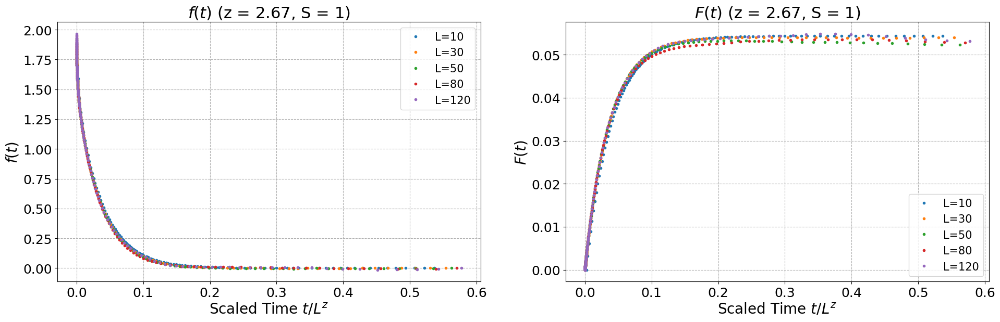

Fitted Taus: {}


In [183]:
# --- Main execution block ---
from scipy.integrate import cumulative_trapezoid
if __name__ == '__main__':
    output_dir = "fig"
    os.makedirs(output_dir, exist_ok=True)
    error = False
    Z_EXPONENT = 2.67
    for S_VALUE in [1]:
        datasets_to_run = [
            {"L": 10, "S": S_VALUE, "T": 10000000, "Tthm": 10000000, "plot_errorbars": error},
            # {"L": 20, "S": S_VALUE, "T":  10000000, "Tthm": 10000000, "plot_errorbars": True},
            {"L": 30, "S": S_VALUE, "T":  10000000, "Tthm": 10000000, "plot_errorbars": error},
            {"L": 50, "S": S_VALUE, "T":  10000000, "Tthm": 10000000, "plot_errorbars": error},
            {"L": 80, "S": S_VALUE, "T":  10000000, "Tthm": 10000000, "plot_errorbars": error},
            # {"L": 100, "S": S_VALUE, "T": 10000000, "Tthm": 10000000, "plot_errorbars": True},
            {"L": 120, "S": S_VALUE, "T": 10000000, "Tthm": 10000000, "plot_errorbars": error},
        ]

        # STEP 1: Load all data for the current S_VALUE once.
        all_data = load_and_process_data(datasets_to_run)
        
        
        # If no data was loaded, skip to the next S_VALUE
        if not all_data:
            print(f"No data found for S={S_VALUE}, skipping plot generation.")
            continue
        
        for L, df in all_data.items():
        # Extract x (time) and y (data) values
            t_values = df['t'].values
            hd_values = df["HD_Avg"].values
            
            # Use cumulative_trapezoid. 'initial=0' ensures the output array
            # has the same size as the input, starting with an integral of 0.
            integral_values = cumulative_trapezoid(hd_values, t_values, initial=0)/(L**Z_EXPONENT)
            
            # Add the result as a new column to the DataFrame
            df["Ft_Avg"] = integral_values
        # STEP 2: Generate the data collapse plot using the loaded data.

        plot_configs_collapse = [
            {'data_col': 'HD_Avg', 'err_col': 'HD_Err', 'label': 'f(t)'},
            {'data_col': 'Ft_Avg',  'label': 'F(t)'},
         
        ]
        # if S_VALUE > 1:
        #     plot_configs_collapse.extend([
        #         {'data_col': 'CC_t_Avg', 'err_col': 'CC_t_Err', 'label': 'C(t)C(0)', 'fit_configs': FitConfigs},
        #         {'data_col': 'DD_t_Avg', 'err_col': 'DD_t_Err', 'label': 'D(t)D(0)', 'fit_configs': FitConfigs},
        #     ])
        
        tau_results = plot_data_collapse(
            processed_data=all_data,
            datasets=datasets_to_run,
            plot_configs=plot_configs_collapse,
            z=Z_EXPONENT,
            output_filename=os.path.join(output_dir, f"S{S_VALUE}_ft.png"),
            ncols=2, # Example of using 2 columns
            axis_type = ('linear','linear')
        )
        print("Fitted Taus:", tau_results)

Corr-Sz

--- Starting Data Loading ---
  Successfully loaded data for L=10, S=1.
  Successfully loaded data for L=20, S=1.
  Successfully loaded data for L=30, S=1.
  Successfully loaded data for L=50, S=1.
  Successfully loaded data for L=80, S=1.
  Successfully loaded data for L=120, S=1.
--- Data Loading Complete ---


Collapse plot saved as fig/S1_OQ.png


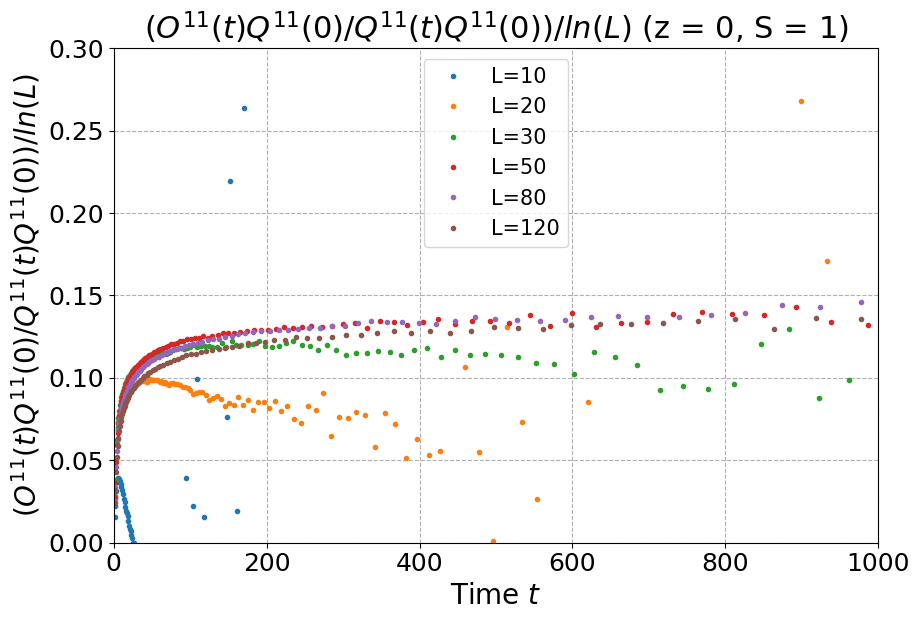


Collapse plot saved as fig/S1_OQ.png


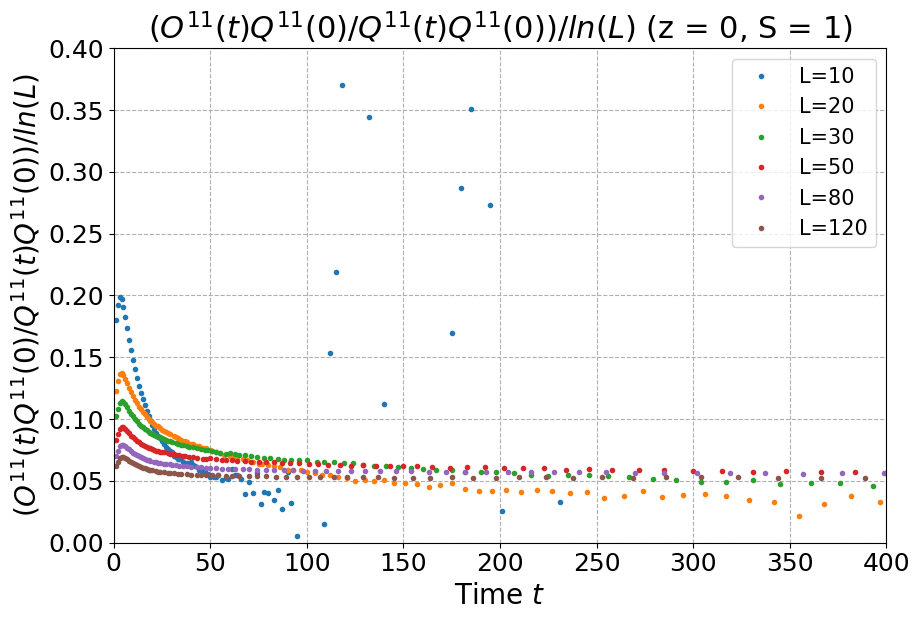

--- Starting Data Loading ---
  Successfully loaded data for L=10, S=2.
  Successfully loaded data for L=20, S=2.
  Successfully loaded data for L=30, S=2.
  Successfully loaded data for L=50, S=2.
  Successfully loaded data for L=80, S=2.
  Successfully loaded data for L=120, S=2.
--- Data Loading Complete ---



KeyError: 'om1n1qm1n1_t_Avg'

In [ ]:
# --- Main execution block ---
if __name__ == '__main__':
    output_dir = "fig"
    os.makedirs(output_dir, exist_ok=True)
    
    Z_EXPONENT = 0
    for S_VALUE in [1,2,5]:
        datasets_to_run = [
            {"L": 10, "S": S_VALUE, "T": 10000000, "Tthm": 10000000, "plot_errorbars": True},
            {"L": 20, "S": S_VALUE, "T":  10000000, "Tthm": 10000000, "plot_errorbars": True},
            {"L": 30, "S": S_VALUE, "T":  10000000, "Tthm": 10000000, "plot_errorbars": True},
            {"L": 50, "S": S_VALUE, "T":  10000000, "Tthm": 10000000, "plot_errorbars": True},
            {"L": 80, "S": S_VALUE, "T":  10000000, "Tthm": 10000000, "plot_errorbars": True},
            {"L": 100, "S": S_VALUE, "T": 10000000, "Tthm": 10000000, "plot_errorbars": True},
            {"L": 120, "S": S_VALUE, "T": 10000000, "Tthm": 10000000, "plot_errorbars": True},
        ]

        # STEP 1: Load all data for the current S_VALUE once.
        all_data = load_and_process_data(datasets_to_run)
        
        # If no data was loaded, skip to the next S_VALUE
        if not all_data:
            print(f"No data found for S={S_VALUE}, skipping plot generation.")
            continue
        
        for L, df in all_data.items():
        # Extract x (time) and y (data) values
           
            # df["q11_lnL2_Avg"] = df["qm1n1m1n1_t_Avg"] * np.log(L)**2
            # df["q11_lnL_Avg"] = df["qm1n1m1n1_t_Avg"] * np.log(L)
            df["o_q"] = df['om1n1qm1n1_t_Avg'] / (df['qm1n1m1n1_t_Avg'])
            df["o_q"]/= np.log(L)

            df["oo_qq"] = df['om1n1m1n1_t_Avg'] / (df['qm1n1m1n1_t_Avg'])
            df["oo_qq"]/= np.log(L)**2
        
        plot_configs_2 = [
                {
                'data_col': 'o_q',
                # 'err_col': 'qm1n0m1n0_t_Err ',
                'label': '(O^{11}(t)Q^{11}(0)/Q^{11}(t)Q^{11}(0)) / ln(L)',
                'scaling_exponent': 0, # Formerly DeltaZ2
                'log_power': 0,        # Formerly log_power_Z
                # 'fit_configs': FitConfigs
            },
        ]
        # Z_EXPONENT = 2.64
        tau_results = plot_data_collapse(
            processed_data=all_data,
            datasets=datasets_to_run,
            plot_configs=plot_configs_2,
            z=Z_EXPONENT,
            output_filename=os.path.join(output_dir, f"S{S_VALUE}_OQ.png"),
            ncols=1, # Example of using 2 columns
            axis_type= ['linear','linear'],
            axis_limits= {'ax1': {'xlim': (0, 1000), 'ylim':(0,0.3)} }
        )

        plot_configs_2 = [
                {
                'data_col': 'oo_qq',
                # 'err_col': 'qm1n0m1n0_t_Err ',
                'label': '(O^{11}(t)Q^{11}(0)/Q^{11}(t)Q^{11}(0)) / ln(L)',
                'scaling_exponent': 0, # Formerly DeltaZ2
                'log_power': 0,        # Formerly log_power_Z
                # 'fit_configs': FitConfigs
            },
        ]
     # Z_EXPONENT = 2.64
        tau_results = plot_data_collapse(
            processed_data=all_data,
            datasets=datasets_to_run,
            plot_configs=plot_configs_2,
            z=Z_EXPONENT,
            output_filename=os.path.join(output_dir, f"S{S_VALUE}_OQ.png"),
            ncols=1, # Example of using 2 columns
            axis_type= ['linear','linear'],
            axis_limits= {'ax1': {'xlim': (0, 400), 'ylim':(0,0.4)} }
        )
    

--- Starting Data Loading ---
  Successfully loaded data for L=10, S=1.
  Successfully loaded data for L=30, S=1.
  Successfully loaded data for L=50, S=1.
  Successfully loaded data for L=80, S=1.
  Successfully loaded data for L=120, S=1.
--- Data Loading Complete ---


--- Generating Parametric Plot: om1n1qm1n1_t_Avg vs. qm1n1m1n1_t_Avg ---
--- Performing parametric fitting... ---
  Fit for L=120 complete. Exponent = 0.5444
0.0589680090315131 0.0067399279151837
xref [-0.00499968  0.10499998]
yref [-0.07722776  0.0327719 ]
  Added y=x reference line passing through the first point of L=120.

Parametric plot saved as fig/S1_parametric_O_vs_Q.png


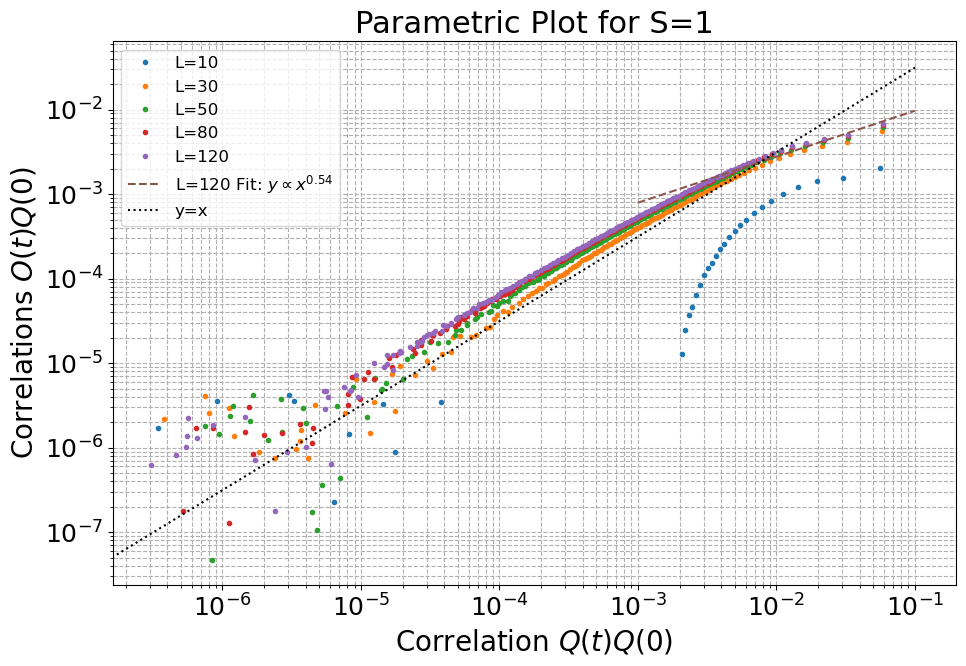


--- Generating Parametric Plot: oq11_lnL_Avg vs. qm1n1m1n1_t_Avg ---
--- Performing parametric fitting... ---
  Fit for L=120 complete. Exponent = 0.5444
0.0589680090315131 0.0014078202694229776
xref [-0.00499968  0.10499998]
yref [-0.08255987  0.0274398 ]
  Added y=x reference line passing through the first point of L=120.

Parametric plot saved as fig/S1_parametric_O_vs_Q.png


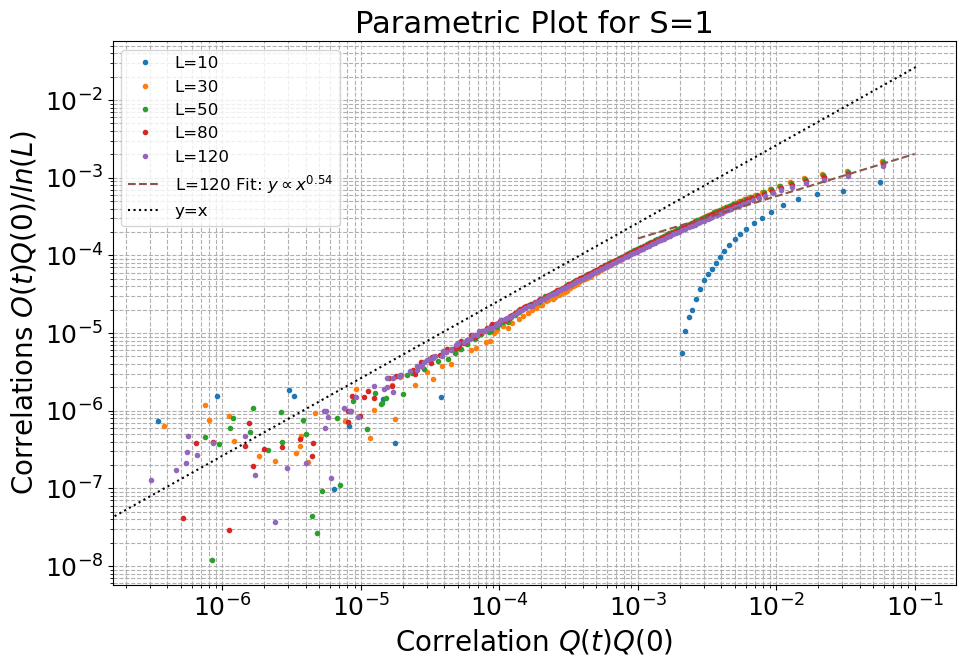


--- Generating Parametric Plot: om1n1m1n1_t_Avg vs. qm1n1m1n1_t_Avg ---
--- Performing parametric fitting... ---
  Fit for L=120 complete. Exponent = 0.9818
0.0589680090315131 0.0381813022316804
xref [-0.00499977  0.10499999]
yref [-0.04578648  0.06421328]
  Added y=x reference line passing through the first point of L=120.

Parametric plot saved as fig/S1_parametric_O_vs_Q.png


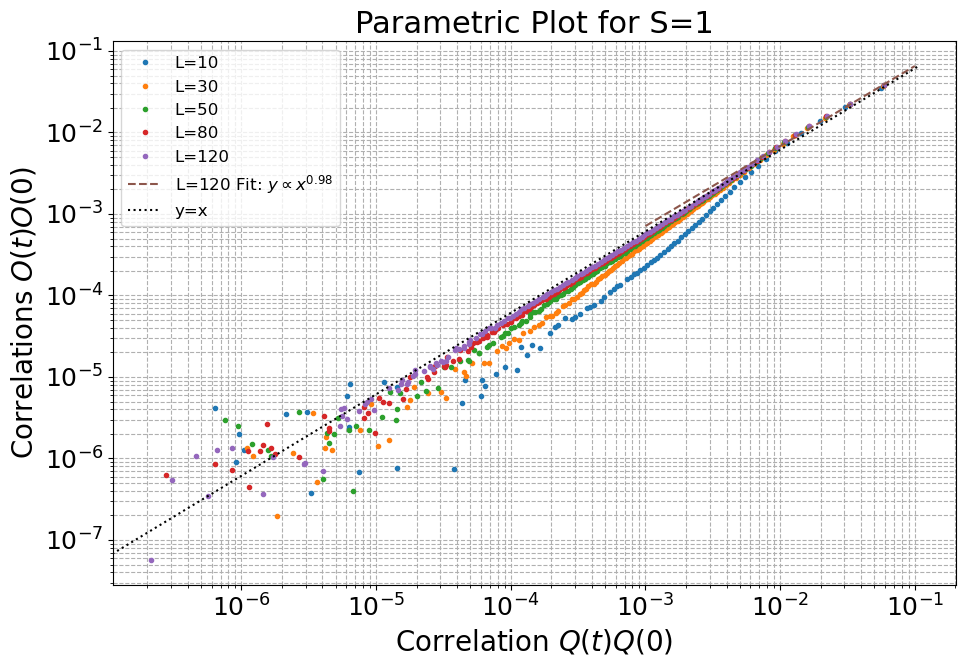


--- Generating Parametric Plot: oo11_lnL_Avg vs. qm1n1m1n1_t_Avg ---
--- Performing parametric fitting... ---
  Fit for L=120 complete. Exponent = 0.9818
0.0589680090315131 0.007975220487689649
xref [-0.00499977  0.10499999]
yref [-0.07599256  0.0340072 ]
  Added y=x reference line passing through the first point of L=120.

Parametric plot saved as fig/S1_parametric_O_vs_Q.png


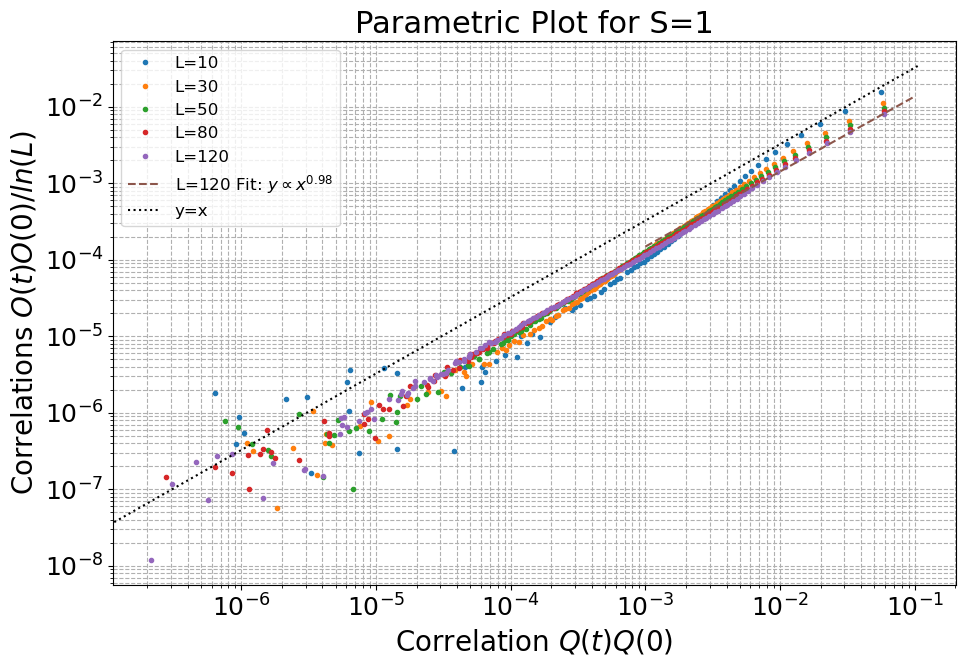


--- Generating Parametric Plot: oo11_lnL2_Avg vs. qm1n1m1n1_t_Avg ---
0.0589680090315131 0.0016658452726761657
xref [-0.00294817  0.0619164 ]
yref [-0.08025034 -0.01538577]
  Added y=x reference line passing through the first point of L=120.

Parametric plot saved as fig/S1_parametric_O_vs_Q.png


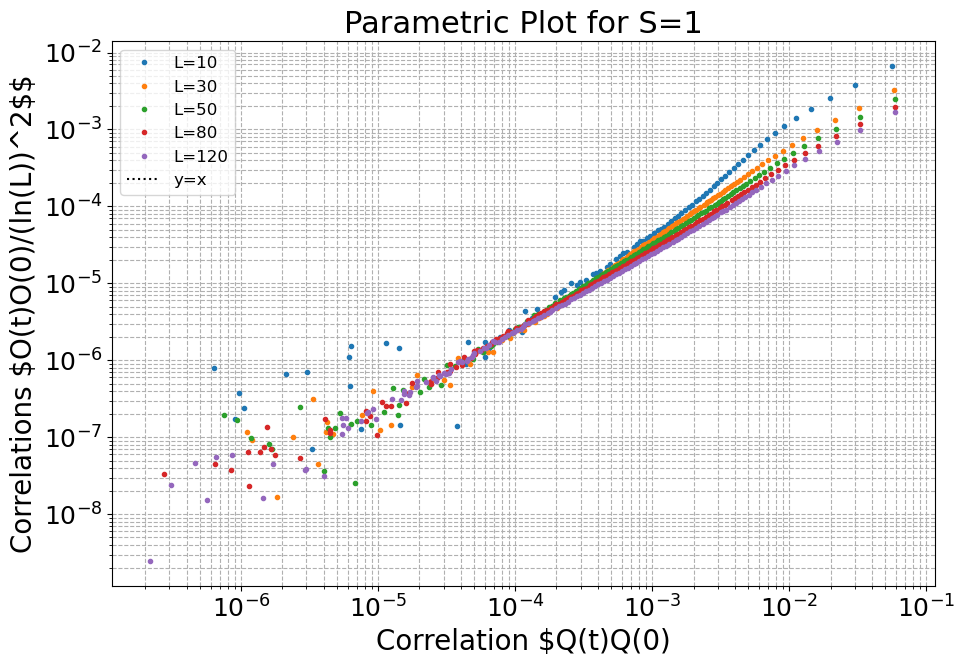

In [230]:

# --- REFACTORED FUNCTION 3: PARAMETRIC PLOT ---
def plot_parametric(
    processed_data,
    x_col,
    y_col,
    output_filename,
    fit_config=None,
    plot_title="Parametric Plot",
    x_label=None,
    y_label=None
):
    """
    Creates a generalized parametric plot of two data columns.

    Args:
        processed_data (dict): Dictionary of DataFrames from load_and_process_data.
        x_col (str): The name of the column for the x-axis.
        y_col (str): The name of the column for the y-axis.
        output_filename (str): Path to save the output plot.
        fit_config (list, optional): Config for power-law fitting, e.g., [(L, (xmin, xmax))].
        plot_title (str, optional): The title for the plot.
        x_label (str, optional): The label for the x-axis. Defaults to x_col.
        y_label (str, optional): The label for the y-axis. Defaults to y_col.
    """
    fig, ax = plt.subplots(figsize=(10, 7))

    print(f"\n--- Generating Parametric Plot: {y_col} vs. {x_col} ---")

    # --- 1. Plot Raw Data ---
    for L, df in processed_data.items():
        if x_col in df.columns and y_col in df.columns:
            mask = (df[x_col] > 0) & (df[y_col] > 0) # Ensure data is plottable on log scale
            ax.plot(df[x_col][mask], df[y_col][mask], 'o', markersize=3, label=f"L={L}")
        else:
            print(f"  Warning: Columns '{x_col}' or '{y_col}' not found for L={L}. Skipping.")

    # --- 2. Perform Fitting ---
    if fit_config:
        print("--- Performing parametric fitting... ---")
        for target_L, (x_min, x_max) in fit_config:
            if target_L not in processed_data:
                print(f"  Warning: L={target_L} not in processed data. Skipping fit.")
                continue

            df_fit = processed_data[target_L]
            fit_mask = (df_fit[x_col] >= x_min) & (df_fit[x_col] <= x_max)
            
            if np.any(fit_mask):
                try:
                    popt, _ = curve_fit(power_law_corr, df_fit[x_col][fit_mask], df_fit[y_col][fit_mask], p0=[1, 1])
                    A_fit, beta_fit = popt
                    
                    x_fit_range = np.logspace(np.log10(x_min), np.log10(x_max), 100)
                    y_fit_range = power_law_corr(x_fit_range, A_fit, beta_fit)
                    
                    label = f'L={target_L} Fit: $y \\propto x^{{{beta_fit:.2f}}}$'
                    ax.plot(x_fit_range, y_fit_range, '--', label=label)
                    print(f"  Fit for L={target_L} complete. Exponent = {beta_fit:.4f}")
                except RuntimeError:
                    print(f"  Error: Power-law fit failed for L={target_L} in range [{x_min}, {x_max}].")
            else:
                print(f"  Warning: No data to fit for L={target_L} in range [{x_min}, {x_max}].")

    # --- 3. Finalize Plot ---
    ax.set_xscale('log'); ax.set_yscale('log')
    ax.set_xlabel(x_label if x_label else f"Raw ${x_col}$")
    ax.set_ylabel(y_label if y_label else f"Raw ${y_col}$")
    ax.set_title(plot_title)
    ax.legend(); ax.grid(True, which="both", ls="--")
    
    plt.tight_layout()
    plt.savefig(output_filename)
    print(f"\nParametric plot saved as {output_filename}")
    plt.show()


# --- REFACTORED FUNCTION 3: PARAMETRIC PLOT (With Reference Line) ---
def plot_parametric(
    processed_data,
    x_col,
    y_col,
    output_filename,
    fit_config=None,
    plot_title="Parametric Plot",
    x_label=None,
    y_label=None
):
    """
    Creates a generalized parametric plot of two data columns, adding a
    y=x reference line anchored to the first point of the largest system size.
    """
    fig, ax = plt.subplots(figsize=(10, 7))

    print(f"\n--- Generating Parametric Plot: {y_col} vs. {x_col} ---")

    # --- 1. Plot Raw Data ---
    for L, df in processed_data.items():
        if x_col in df.columns and y_col in df.columns:
            mask = (df[x_col] > 0) & (df[y_col] > 0) # Ensure data is plottable on log scale
            if np.any(mask):
                ax.plot(df[x_col][mask], df[y_col][mask], 'o', markersize=3, label=f"L={L}")
        else:
            print(f"  Warning: Columns '{x_col}' or '{y_col}' not found for L={L}. Skipping.")

    # --- 2. Perform Fitting ---
    if fit_config:
        print("--- Performing parametric fitting... ---")
        for target_L, (x_min, x_max) in fit_config:
            if target_L not in processed_data:
                print(f"  Warning: L={target_L} not in processed data. Skipping fit.")
                continue

            df_fit = processed_data[target_L]
            fit_mask = (df_fit[x_col] >= x_min) & (df_fit[x_col] <= x_max)
            
            if np.any(fit_mask):
                try:
                    popt, _ = curve_fit(power_law_corr, df_fit[x_col][fit_mask], df_fit[y_col][fit_mask], p0=[1, 1])
                    A_fit, beta_fit = popt
                    
                    x_fit_range = np.logspace(np.log10(x_min), np.log10(x_max), 100)
                    y_fit_range = power_law_corr(x_fit_range, A_fit, beta_fit)
                    
                    label = f'L={target_L} Fit: $y \\propto x^{{{beta_fit:.2f}}}$'
                    ax.plot(x_fit_range, y_fit_range, '--', label=label)
                    print(f"  Fit for L={target_L} complete. Exponent = {beta_fit:.4f}")
                except RuntimeError:
                    print(f"  Error: Power-law fit failed for L={target_L} in range [{x_min}, {x_max}].")
            else:
                print(f"  Warning: No data to fit for L={target_L} in range [{x_min}, {x_max}].")

    # --- 3. Finalize Plot ---

    # ### NEW: Add a y=x reference line ###
    try:
        if processed_data: # Ensure there is data
            # Find the largest system size L
            max_L = max(processed_data.keys())
            df_max_L = processed_data[max_L]
            
            # Find the first valid data point of the largest L
            mask_max_L = (df_max_L[x_col] > 0) & (df_max_L[y_col] > 0)
            if np.any(mask_max_L):
                x0 = df_max_L[x_col][mask_max_L].iloc[0]
                y0 = df_max_L[y_col][mask_max_L].iloc[0]
                print(x0,y0)
                # The line y=x has slope 1. We want it to pass through (x0, y0).
                # The equation is y = x + c, so y0 = x0 + c => c = y0 - x0.
                y_intercept = y0 - x0-0.02
                
                # Get the plot's x-axis limits to draw the line across the whole view
                x_lims = ax.get_xlim()
                x_ref = np.array(x_lims)
                y_ref = x_ref + y_intercept # y = x + c
                print("xref",x_ref)
                print("yref",y_ref)
                # Plot the reference line
                ax.plot(x_ref, y_ref, color='black', linestyle=':', label=f'y=x')
                print(f"  Added y=x reference line passing through the first point of L={max_L}.")

    except Exception as e:
        print(f"  Could not add reference line: {e}")
    
    ax.set_xscale('log'); ax.set_yscale('log')
    ax.set_xlabel(x_label if x_label else f"Raw ${x_col}$")
    ax.set_ylabel(y_label if y_label else f"Raw ${y_col}$")
    ax.set_title(plot_title)
    ax.legend(); ax.grid(True, which="both", ls="--")
    
    plt.tight_layout()
    plt.savefig(output_filename)
    print(f"\nParametric plot saved as {output_filename}")
    plt.show()

# --- Main execution block ---
from scipy.integrate import cumulative_trapezoid
if __name__ == '__main__':
    output_dir = "fig"
    os.makedirs(output_dir, exist_ok=True)
    error = False
    Z_EXPONENT = 2.67
    for S_VALUE in [1]:
        datasets_to_run = [
            {"L": 10, "S": S_VALUE, "T": 10000000, "Tthm": 10000000, "plot_errorbars": error},
            # {"L": 20, "S": S_VALUE, "T":  10000000, "Tthm": 10000000, "plot_errorbars": True},
            {"L": 30, "S": S_VALUE, "T":  10000000, "Tthm": 10000000, "plot_errorbars": error},
            {"L": 50, "S": S_VALUE, "T":  10000000, "Tthm": 10000000, "plot_errorbars": error},
            {"L": 80, "S": S_VALUE, "T":  10000000, "Tthm": 10000000, "plot_errorbars": error},
            # {"L": 100, "S": S_VALUE, "T": 10000000, "Tthm": 10000000, "plot_errorbars": True},
            {"L": 120, "S": S_VALUE, "T": 10000000, "Tthm": 10000000, "plot_errorbars": error},
        ]

        # STEP 1: Load all data for the current S_VALUE once.
        all_data = load_and_process_data(datasets_to_run)
        
        
        # If no data was loaded, skip to the next S_VALUE
        if not all_data:
            print(f"No data found for S={S_VALUE}, skipping plot generation.")
            continue
        
    
        # STEP 2: Generate the data collapse plot using the loaded data.

        
          # STEP 3: Generate a parametric plot using the same loaded data.
        # This example plots SzSz_t_Avg vs h_t_Avg, but you can choose any columns.
        for L, df in all_data.items():
        # Extract x (time) and y (data) values
           
            # df["q11_lnL2_Avg"] = df["qm1n1m1n1_t_Avg"] * np.log(L)**2
            # df["q11_lnL_Avg"] = df["qm1n1m1n1_t_Avg"] * np.log(L)
            df["oq11_lnL_Avg"] = df['om1n1qm1n1_t_Avg'] / np.log(L)
            df["oo11_lnL_Avg"] = df['om1n1m1n1_t_Avg'] / (np.log(L))
            df["oo11_lnL2_Avg"] = df['om1n1m1n1_t_Avg'] / (np.log(L))**2
        # df["qm1n1m1n1_t_Avg"] *= 

        plot_parametric(
        processed_data=all_data,
        x_col='qm1n1m1n1_t_Avg',
        y_col='om1n1qm1n1_t_Avg',
        output_filename=os.path.join(output_dir, f"S{S_VALUE}_parametric_O_vs_Q.png"),
        plot_title=f"Parametric Plot for S={S_VALUE}",
        x_label=r'Correlation $Q(t)Q(0)$',
        y_label=r'Correlations $O(t)Q(0)$',
        fit_config=[(120, (1e-3, 1e-1))] # Example: fit for L=120 in a specific x-range
        )

        plot_parametric(
        processed_data=all_data,
        x_col='qm1n1m1n1_t_Avg',
        y_col='oq11_lnL_Avg',
        output_filename=os.path.join(output_dir, f"S{S_VALUE}_parametric_O_vs_Q.png"),
        plot_title=f"Parametric Plot for S={S_VALUE}",
        x_label=r'Correlation $Q(t)Q(0)$',
        y_label=r'Correlations $O(t)Q(0)/ln(L)$',
        fit_config=[(120, (1e-3, 1e-1))] # Example: fit for L=120 in a specific x-range
        )




        plot_parametric(
            processed_data=all_data,
            x_col='qm1n1m1n1_t_Avg',
            y_col='om1n1m1n1_t_Avg',
            output_filename=os.path.join(output_dir, f"S{S_VALUE}_parametric_O_vs_Q.png"),
            plot_title=f"Parametric Plot for S={S_VALUE}",
            x_label=r'Correlation $Q(t)Q(0)$',
            y_label=r'Correlations $O(t)O(0)$',
            fit_config=[(120, (1e-3, 1e-1))] # Example: fit for L=120 in a specific x-range
            )
        plot_parametric(
            processed_data=all_data,
            x_col='qm1n1m1n1_t_Avg',
            y_col='oo11_lnL_Avg',
            output_filename=os.path.join(output_dir, f"S{S_VALUE}_parametric_O_vs_Q.png"),
            plot_title=f"Parametric Plot for S={S_VALUE}",
            x_label=r'Correlation $Q(t)Q(0)$',
            y_label=r'Correlations $O(t)O(0)/ln(L)$',
            fit_config=[(120, (1e-3, 1e-1))] # Example: fit for L=120 in a specific x-range
            )
        plot_parametric(
            processed_data=all_data,
            x_col='qm1n1m1n1_t_Avg',
            y_col='oo11_lnL2_Avg',
            output_filename=os.path.join(output_dir, f"S{S_VALUE}_parametric_O_vs_Q.png"),
            plot_title=f"Parametric Plot for S={S_VALUE}",
            x_label=r'Correlation $Q(t)Q(0)',
            y_label=r'Correlations $O(t)O(0)/(ln(L))^2$$',
            # fit_config=[(120, (1e-3, 1e-1))] # Example: fit for L=120 in a specific x-range
            )
        
       

--- Starting Data Loading ---
  Successfully loaded data for L=10, S=2.
  Successfully loaded data for L=30, S=2.
  Successfully loaded data for L=50, S=2.
  Successfully loaded data for L=80, S=2.
  Successfully loaded data for L=120, S=2.
--- Data Loading Complete ---


--- Generating Parametric Plot: DD_t_Avg vs. SzSz_t_Avg ---
--- Performing parametric fitting... ---
  Fit for L=120 complete. Exponent = 1.4782

Parametric plot saved as fig/S2_parametric_Sz_vs_h.png


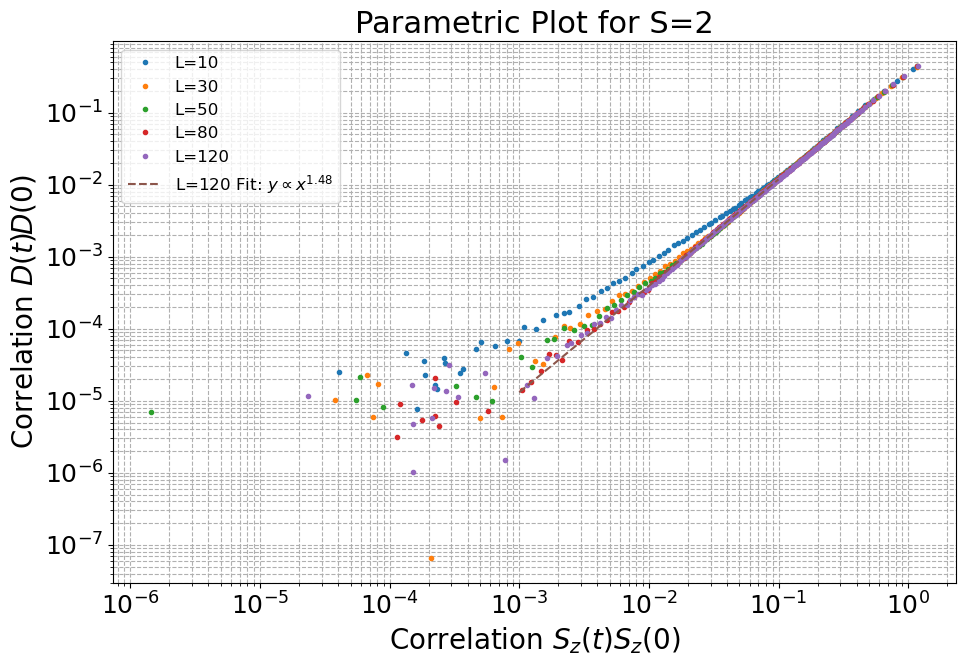

In [185]:
# --- Main execution block ---
from scipy.integrate import cumulative_trapezoid
if __name__ == '__main__':
    output_dir = "fig"
    os.makedirs(output_dir, exist_ok=True)
    error = False
    Z_EXPONENT = 2.67
    for S_VALUE in [2]:
        datasets_to_run = [
            {"L": 10, "S": S_VALUE, "T": 10000000, "Tthm": 10000000, "plot_errorbars": error},
            # {"L": 20, "S": S_VALUE, "T":  10000000, "Tthm": 10000000, "plot_errorbars": True},
            {"L": 30, "S": S_VALUE, "T":  10000000, "Tthm": 10000000, "plot_errorbars": error},
            {"L": 50, "S": S_VALUE, "T":  10000000, "Tthm": 10000000, "plot_errorbars": error},
            {"L": 80, "S": S_VALUE, "T":  10000000, "Tthm": 10000000, "plot_errorbars": error},
            # {"L": 100, "S": S_VALUE, "T": 10000000, "Tthm": 10000000, "plot_errorbars": True},
            {"L": 120, "S": S_VALUE, "T": 10000000, "Tthm": 10000000, "plot_errorbars": error},
        ]

        # STEP 1: Load all data for the current S_VALUE once.
        all_data = load_and_process_data(datasets_to_run)
        
        
        # If no data was loaded, skip to the next S_VALUE
        if not all_data:
            print(f"No data found for S={S_VALUE}, skipping plot generation.")
            continue
        
    
        # STEP 2: Generate the data collapse plot using the loaded data.

        
          # STEP 3: Generate a parametric plot using the same loaded data.
        # This example plots SzSz_t_Avg vs h_t_Avg, but you can choose any columns.
        plot_parametric(
            processed_data=all_data,
            x_col='SzSz_t_Avg',
            y_col='DD_t_Avg',
            output_filename=os.path.join(output_dir, f"S{S_VALUE}_parametric_Sz_vs_h.png"),
            plot_title=f"Parametric Plot for S={S_VALUE}",
            x_label=r'Correlation $S_{z}(t)S_z(0)$',
            y_label=r'Correlation $D(t)D(0)$',
            fit_config=[(120, (1e-3, 1e-1))] # Example: fit for L=120 in a specific x-range
        )

--- Starting Data Loading ---
  Successfully loaded data for L=120, S=1.
--- Data Loading Complete ---


--- Generating Parametric Plot: ['om1n0m1n0_t_Avg', 'om1n1m1n1_t_Avg', 'om2n1m2n1_t_Avg', 'om2n2m2n2_t_Avg', 'om3n3m3n3_t_Avg'] vs. SzSz_t_Avg ---
--- Performing parametric fitting for om1n0m1n0_t_Avg... ---
  Fit for L=120, om1n0m1n0_t_Avg complete. Exponent = 1.0229
--- Performing parametric fitting for om1n1m1n1_t_Avg... ---
  Fit for L=120, om1n1m1n1_t_Avg complete. Exponent = 2.0609
--- Performing parametric fitting for om2n1m2n1_t_Avg... ---
  Fit for L=120, om2n1m2n1_t_Avg complete. Exponent = 2.0632
--- Performing parametric fitting for om2n2m2n2_t_Avg... ---
  Fit for L=120, om2n2m2n2_t_Avg complete. Exponent = 2.0941
--- Performing parametric fitting for om3n3m3n3_t_Avg... ---
  Fit for L=120, om3n3m3n3_t_Avg complete. Exponent = 2.0223

Parametric plot saved as fig/S1_parametric_Sz_vs_h.png


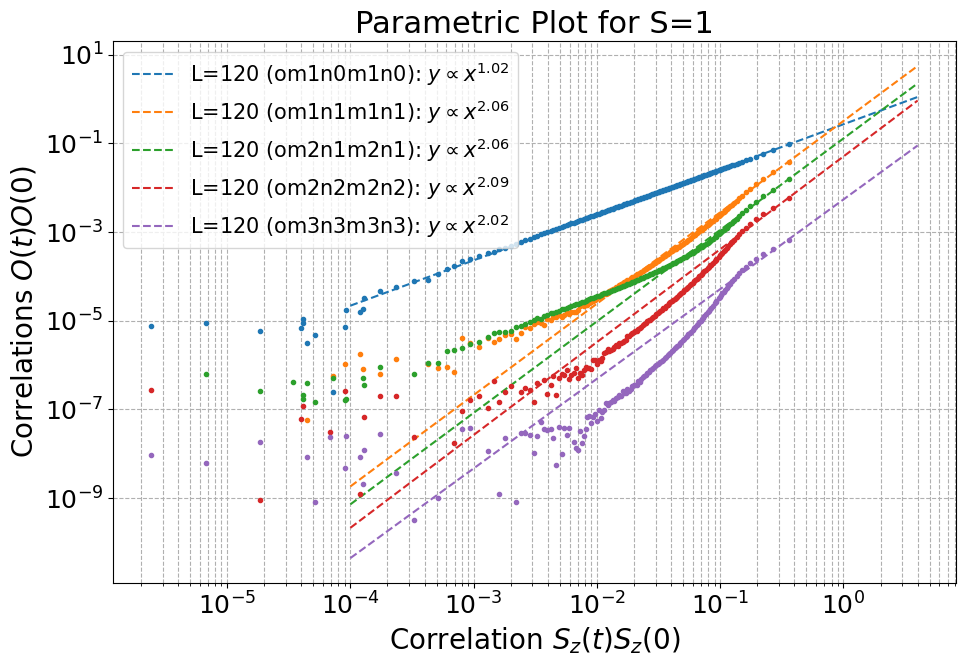


--- Generating Parametric Plot: ['qm1n0m1n0_t_Avg', 'qm1n1m1n1_t_Avg', 'qm2n1m2n1_t_Avg', 'qm2n2m2n2_t_Avg', 'qm3n3m3n3_t_Avg'] vs. SzSz_t_Avg ---
--- Performing parametric fitting for qm1n0m1n0_t_Avg... ---
  Fit for L=120, qm1n0m1n0_t_Avg complete. Exponent = 1.0224
--- Performing parametric fitting for qm1n1m1n1_t_Avg... ---
  Fit for L=120, qm1n1m1n1_t_Avg complete. Exponent = 2.0947
--- Performing parametric fitting for qm2n1m2n1_t_Avg... ---
  Fit for L=120, qm2n1m2n1_t_Avg complete. Exponent = 1.9914
--- Performing parametric fitting for qm2n2m2n2_t_Avg... ---
  Fit for L=120, qm2n2m2n2_t_Avg complete. Exponent = 2.2370
--- Performing parametric fitting for qm3n3m3n3_t_Avg... ---
  Fit for L=120, qm3n3m3n3_t_Avg complete. Exponent = 2.9231

Parametric plot saved as fig/S1_parametric_Sz_vs_h.png


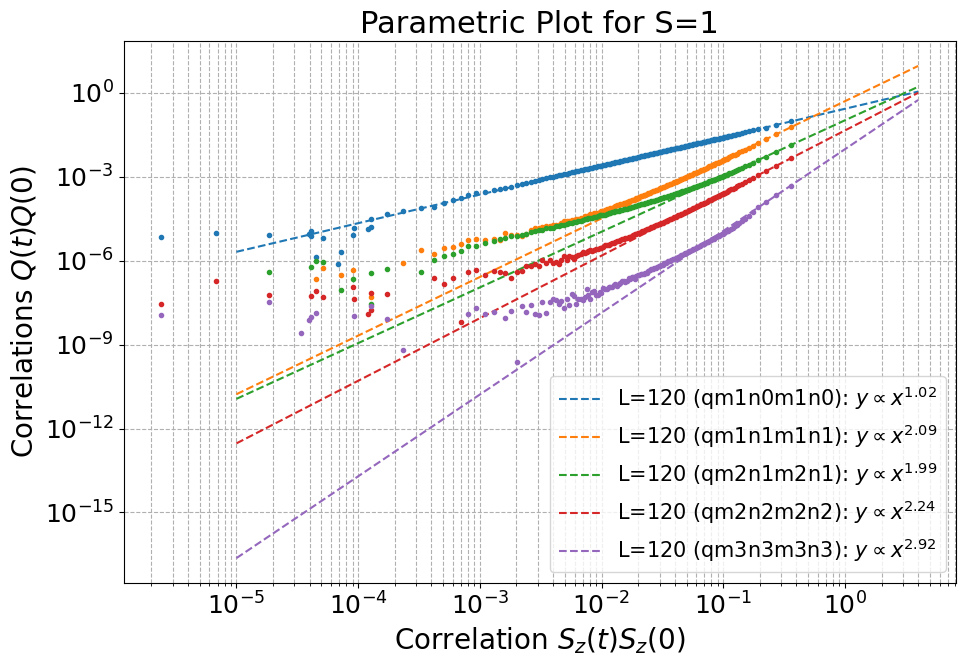


--- Generating Parametric Plot: ['om1n1m1n1_t_Avg'] vs. qm1n1m1n1_t_Avg ---
--- Performing parametric fitting for om1n1m1n1_t_Avg... ---
  Fit for L=120, om1n1m1n1_t_Avg complete. Exponent = 0.9818

Parametric plot saved as fig/S1_parametric_Sz_vs_h.png


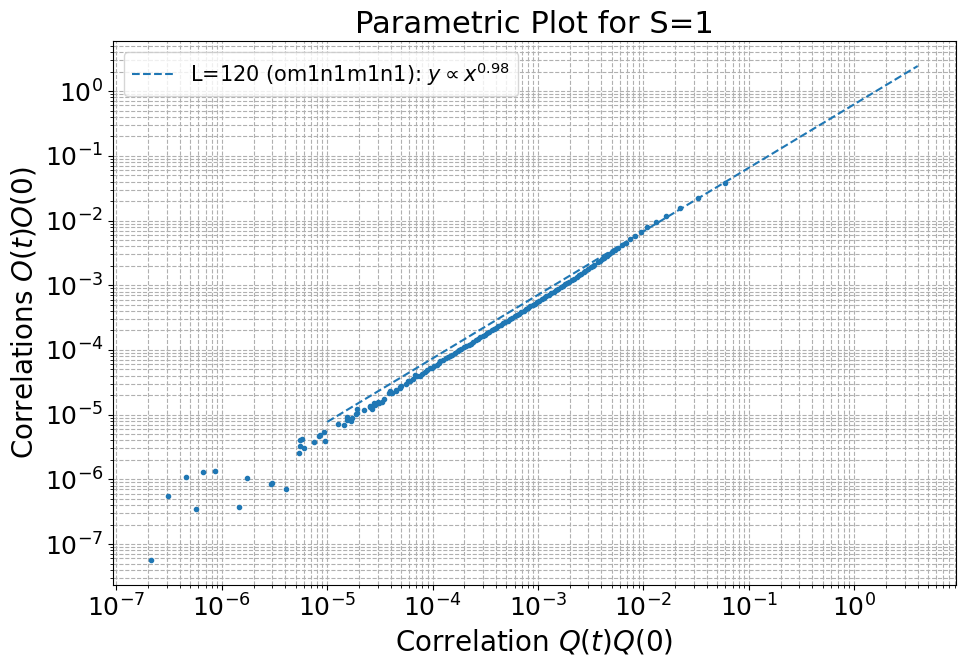

--- Starting Data Loading ---
  Successfully loaded data for L=120, S=2.
--- Data Loading Complete ---


--- Generating Parametric Plot: ['om1n0m1n0_t_Avg', 'om1n1m1n1_t_Avg', 'om2n1m2n1_t_Avg', 'om2n2m2n2_t_Avg', 'om3n3m3n3_t_Avg'] vs. SzSz_t_Avg ---
--- Performing parametric fitting for om1n0m1n0_t_Avg... ---
  Fit for L=120, om1n0m1n0_t_Avg complete. Exponent = 1.0172
--- Performing parametric fitting for om1n1m1n1_t_Avg... ---
  Fit for L=120, om1n1m1n1_t_Avg complete. Exponent = 2.0262
--- Performing parametric fitting for om2n1m2n1_t_Avg... ---
  Fit for L=120, om2n1m2n1_t_Avg complete. Exponent = 2.0281
--- Performing parametric fitting for om2n2m2n2_t_Avg... ---
  Fit for L=120, om2n2m2n2_t_Avg complete. Exponent = 2.3015
--- Performing parametric fitting for om3n3m3n3_t_Avg... ---
  Fit for L=120, om3n3m3n3_t_Avg complete. Exponent = 2.7512

Parametric plot saved as fig/S2_parametric_Sz_vs_h.png


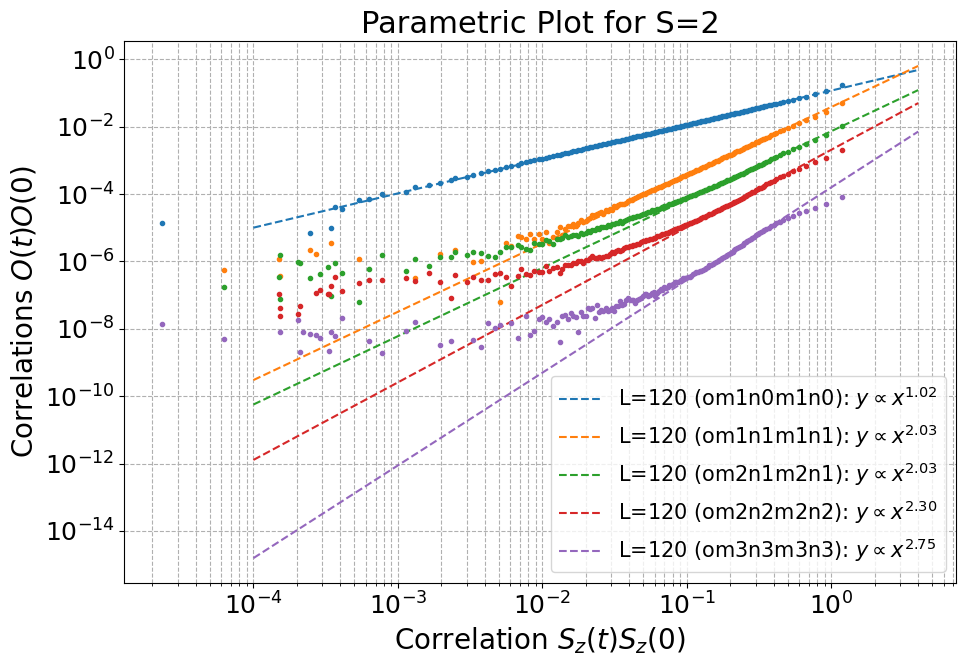


--- Generating Parametric Plot: ['qm1n0m1n0_t_Avg', 'qm1n1m1n1_t_Avg', 'qm2n1m2n1_t_Avg', 'qm2n2m2n2_t_Avg', 'qm3n3m3n3_t_Avg'] vs. SzSz_t_Avg ---
--- Performing parametric fitting for qm1n0m1n0_t_Avg... ---
  Fit for L=120, qm1n0m1n0_t_Avg complete. Exponent = 1.0174
--- Performing parametric fitting for qm1n1m1n1_t_Avg... ---
  Fit for L=120, qm1n1m1n1_t_Avg complete. Exponent = 1.9916
--- Performing parametric fitting for qm2n1m2n1_t_Avg... ---
  Fit for L=120, qm2n1m2n1_t_Avg complete. Exponent = 1.7608
--- Performing parametric fitting for qm2n2m2n2_t_Avg... ---
  Fit for L=120, qm2n2m2n2_t_Avg complete. Exponent = 2.1627
--- Performing parametric fitting for qm3n3m3n3_t_Avg... ---
  Fit for L=120, qm3n3m3n3_t_Avg complete. Exponent = 3.3933

Parametric plot saved as fig/S2_parametric_Sz_vs_h.png


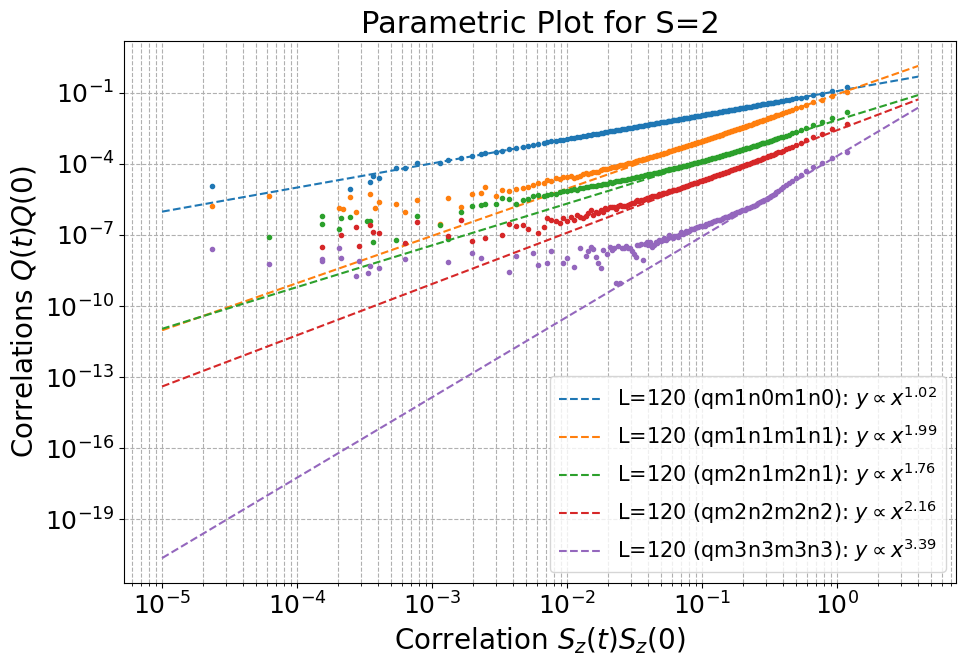


--- Generating Parametric Plot: ['om1n1m1n1_t_Avg'] vs. qm1n1m1n1_t_Avg ---
--- Performing parametric fitting for om1n1m1n1_t_Avg... ---
  Fit for L=120, om1n1m1n1_t_Avg complete. Exponent = 1.0235

Parametric plot saved as fig/S2_parametric_Sz_vs_h.png


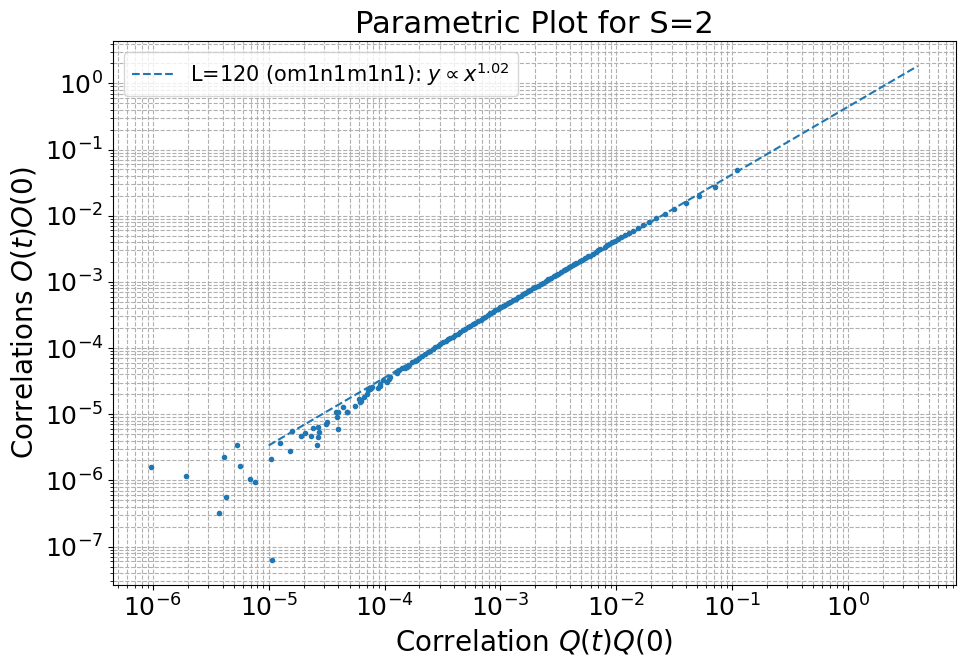

In [186]:

if __name__ == '__main__':
    output_dir = "fig"
    os.makedirs(output_dir, exist_ok=True)
    error = False
    Z_EXPONENT = 2.67
    for S_VALUE in [1,2]:
        datasets_to_run = [
            # {"L": 10, "S": S_VALUE, "T": 10000000, "Tthm": 10000000, "plot_errorbars": error},
            # # {"L": 20, "S": S_VALUE, "T":  10000000, "Tthm": 10000000, "plot_errorbars": True},
            # {"L": 30, "S": S_VALUE, "T":  10000000, "Tthm": 10000000, "plot_errorbars": error},
            # {"L": 50, "S": S_VALUE, "T":  10000000, "Tthm": 10000000, "plot_errorbars": error},
            # {"L": 80, "S": S_VALUE, "T":  10000000, "Tthm": 10000000, "plot_errorbars": error},
            # # {"L": 100, "S": S_VALUE, "T": 10000000, "Tthm": 10000000, "plot_errorbars": True},
            {"L": 120, "S": S_VALUE, "T": 10000000, "Tthm": 10000000, "plot_errorbars": error},
        ]

        # STEP 1: Load all data for the current S_VALUE once.
        all_data = load_and_process_data(datasets_to_run)
        
        
        # If no data was loaded, skip to the next S_VALUE
        if not all_data:
            print(f"No data found for S={S_VALUE}, skipping plot generation.")
            continue
        
    
        # STEP 2: Generate the data collapse plot using the loaded data.

        
          # STEP 3: Generate a parametric plot using the same loaded data.
        # This example plots SzSz_t_Avg vs h_t_Avg, but you can choose any columns.
        plot_multi_parametric(
            processed_data=all_data,
            x_col='SzSz_t_Avg',
            y_cols=['om1n0m1n0_t_Avg','om1n1m1n1_t_Avg','om2n1m2n1_t_Avg','om2n2m2n2_t_Avg','om3n3m3n3_t_Avg'],
                    # 'qm1n0m1n0_t_Avg','qm1n1m1n1_t_Avg','qm2n1m2n1_t_Avg','qm2n2m2n2_t_Avg','qm3n3m3n3_t_Avg'],
            output_filename=os.path.join(output_dir, f"S{S_VALUE}_parametric_Sz_vs_h.png"),
            plot_title=f"Parametric Plot for S={S_VALUE}",
            x_label=r'Correlation $S_{z}(t)S_z(0)$',
            y_label=r'Correlations $O(t)O(0)$',
            fit_config=[(120, (1e-2, 4e-1))] # Example: fit for L=120 in a specific x-range
        )

        plot_multi_parametric(
            processed_data=all_data,
            x_col='SzSz_t_Avg',
            # y_cols=['om1n0m1n0_t_Avg','om1n1m1n1_t_Avg','om2n1m2n1_t_Avg','om2n2m2n2_t_Avg','om3n3m3n3_t_Avg',
            y_cols=['qm1n0m1n0_t_Avg','qm1n1m1n1_t_Avg','qm2n1m2n1_t_Avg','qm2n2m2n2_t_Avg','qm3n3m3n3_t_Avg'],
            output_filename=os.path.join(output_dir, f"S{S_VALUE}_parametric_Sz_vs_h.png"),
            plot_title=f"Parametric Plot for S={S_VALUE}",
            x_label=r'Correlation $S_{z}(t)S_z(0)$',
            y_label=r'Correlations $Q(t)Q(0)$',
            fit_config=[(120, (1e-3, 4e-1))] # Example: fit for L=120 in a specific x-range
        )
        
        plot_multi_parametric(
            processed_data=all_data,
            x_col='qm1n1m1n1_t_Avg',
            # y_cols=['om1n0m1n0_t_Avg','om1n1m1n1_t_Avg','om2n1m2n1_t_Avg','om2n2m2n2_t_Avg','om3n3m3n3_t_Avg',
            y_cols=['om1n1m1n1_t_Avg'],
            output_filename=os.path.join(output_dir, f"S{S_VALUE}_parametric_Sz_vs_h.png"),
            plot_title=f"Parametric Plot for S={S_VALUE}",
            x_label=r'Correlation $Q(t)Q(0)$',
            y_label=r'Correlations $O(t)O(0)$',
            fit_config=[(120, (1e-3, 4e-1))] # Example: fit for L=120 in a specific x-range
        )

## Data Collapse

--- Starting Data Loading ---
  Successfully loaded data for L=10, S=1.
  Successfully loaded data for L=20, S=1.
  Successfully loaded data for L=30, S=1.
  Successfully loaded data for L=50, S=1.
  Successfully loaded data for L=80, S=1.
  Successfully loaded data for L=120, S=1.
--- Data Loading Complete ---



/var/folders/26/b_j5qbw50rx0y2hh_svmqm100000gn/T/ipykernel_1563/1376450707.py:181: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(loc='best', fontsize='small')



Collapse plot saved as fig/S1_Corr.png


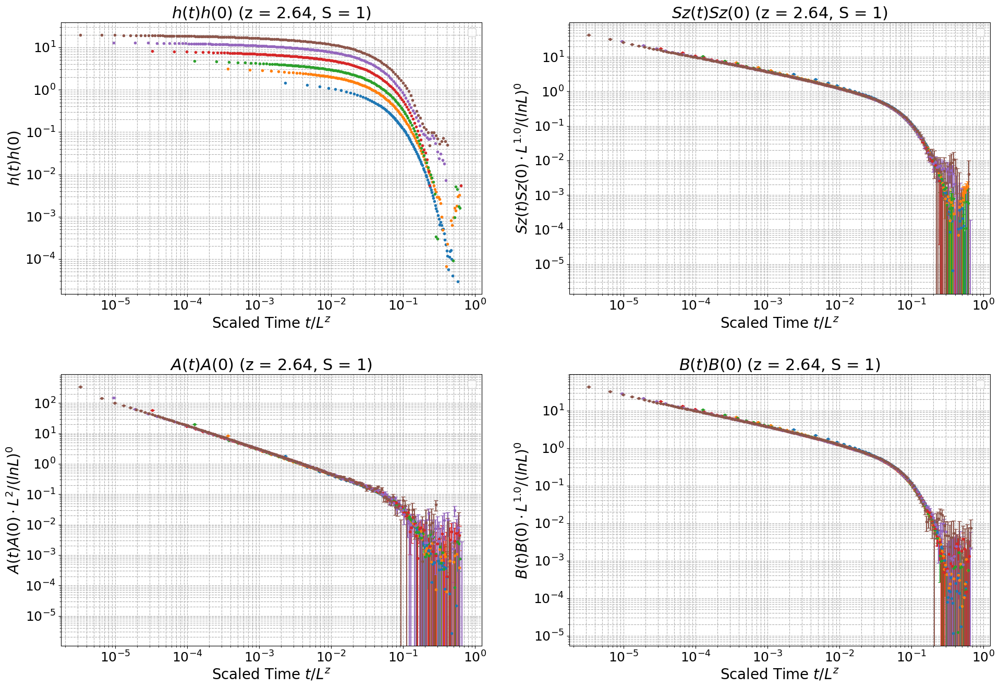


Collapse plot saved as fig/S1_OQ.png


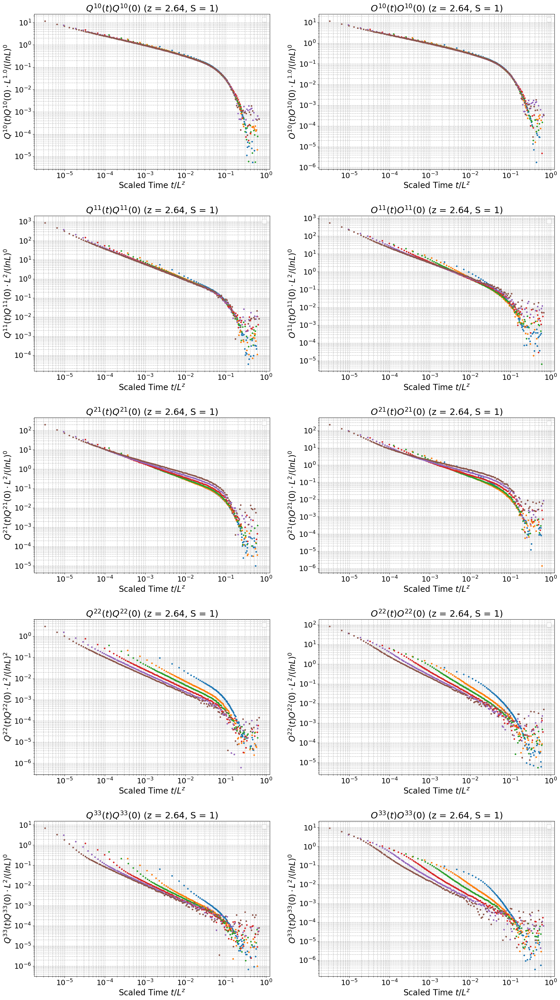

In [187]:
# --- Main execution block ---
if __name__ == '__main__':
    output_dir = "fig"
    os.makedirs(output_dir, exist_ok=True)
    
    Z_EXPONENT = 2.64
    for S_VALUE in [1]:
        datasets_to_run = [
            {"L": 10, "S": S_VALUE, "T": 10000000, "Tthm": 10000000, "plot_errorbars": True},
            {"L": 20, "S": S_VALUE, "T":  10000000, "Tthm": 10000000, "plot_errorbars": True},
            {"L": 30, "S": S_VALUE, "T":  10000000, "Tthm": 10000000, "plot_errorbars": True},
            {"L": 50, "S": S_VALUE, "T":  10000000, "Tthm": 10000000, "plot_errorbars": True},
            {"L": 80, "S": S_VALUE, "T":  10000000, "Tthm": 10000000, "plot_errorbars": True},
            {"L": 100, "S": S_VALUE, "T": 10000000, "Tthm": 10000000, "plot_errorbars": True},
            {"L": 120, "S": S_VALUE, "T": 10000000, "Tthm": 10000000, "plot_errorbars": True},
        ]

        # STEP 1: Load all data for the current S_VALUE once.
        all_data = load_and_process_data(datasets_to_run)
        
        # If no data was loaded, skip to the next S_VALUE
        if not all_data:
            print(f"No data found for S={S_VALUE}, skipping plot generation.")
            continue

        # # STEP 2: Generate the data collapse plot using the loaded data.
        # FitConfigs = [   # Fits for this specific plot
        #     (10, (5, 50), 'power'),
        #     (20, (10, 50), 'power'),
        #     (30, (10, 100), 'power'),
        #     (50, (50, 300), 'power'),
        #     (80, (50, 1000), 'power'),
        #     # (100, (50, 500), 'power'),
        #     (120, (100, 2000), 'power'),
        #     # (1000, (10000, 20000), 'exp'),
        #     ]
        plot_configs_collapse = [
            {'data_col': 'HH_t_Avg', 'err_col': '_t_Err', 'label': 'h(t)h(0)', 'fit_configs': FitConfigs},
            {'data_col': 'SzSz_t_Avg', 'err_col': 'SzSz_t_Err', 'label': 'Sz(t)Sz(0)', 'fit_configs': FitConfigs,'scaling_exponent': 0.5*2 },
            {'data_col': 'AA_t_Avg', 'err_col': 'AA_t_Err', 'label': 'A(t)A(0)', 'fit_configs': FitConfigs,'scaling_exponent': 1*2 },
            {'data_col': 'BB_t_Avg', 'err_col': 'BB_t_Err', 'label': 'B(t)B(0)', 'fit_configs': FitConfigs,'scaling_exponent': 0.5*2 },
                
        ]
        # if S_VALUE > 1:
        #     plot_configs_collapse.extend([
        #         {'data_col': 'CC_t_Avg', 'err_col': 'CC_t_Err', 'label': 'C(t)C(0)', 'fit_configs': FitConfigs},
        #         {'data_col': 'DD_t_Avg', 'err_col': 'DD_t_Err', 'label': 'D(t)D(0)', 'fit_configs': FitConfigs},
        #     ])

        tau_results = plot_data_collapse(
            processed_data=all_data,
            datasets=datasets_to_run,
            plot_configs=plot_configs_collapse,
            z=Z_EXPONENT,
            output_filename=os.path.join(output_dir, f"S{S_VALUE}_Corr.png"),
            ncols=2 # Example of using 2 columns
        )
        # print("Fitted Taus:", tau_results)

        plot_configs_2 = [
                {
                'data_col': 'qm1n0m1n0_t_Avg',
                'err_col': 'qm1n0m1n0_t_Err ',
                'label': 'Q^{10}(t)Q^{10}(0)',
                'scaling_exponent': 0.5*2, # Formerly DeltaZ2
                'log_power': 0,        # Formerly log_power_Z
                'fit_configs': FitConfigs
            },
            {
                'data_col': 'om1n0m1n0_t_Avg',
                'err_col': 'om1n0m1n0_t_Err ',
                'label': 'O^{10}(t)O^{10}(0)',
                'scaling_exponent': 0.5*2, # Formerly DeltaZ2
                'log_power': 0,        # Formerly log_power_Z
                'fit_configs': FitConfigs
            },
            {
                'data_col': 'qm1n1m1n1_t_Avg',
                'err_col': 'qm1n1m1n1_t_Err ',
                'label': 'Q^{11}(t)Q^{11}(0)',
                'scaling_exponent': 1*2, # Formerly DeltaZ2
                'log_power': 0,        # Formerly log_power_Z
                'fit_configs': FitConfigs
            },
            {
                'data_col': 'om1n1m1n1_t_Avg',
                'err_col': 'om1n1m1n1_t_Err ',
                'label': 'O^{11}(t)O^{11}(0)',
                'scaling_exponent': 1*2, # Formerly DeltaZ2
                'log_power': 0,        # Formerly log_power_Z
                'fit_configs': FitConfigs
            },
                        {
                'data_col': 'qm2n1m2n1_t_Avg',
                'err_col': 'qm2n1m2n1_t_Err ',
                'label': 'Q^{21}(t)Q^{21}(0)',
                'scaling_exponent': 1*2, # Formerly DeltaZ2
                'log_power': 0,        # Formerly log_power_Z
                'fit_configs': FitConfigs
            },
            {
                'data_col': 'om2n1m2n1_t_Avg',
                'err_col': 'om2n1m2n1_t_Err ',
                'label': 'O^{21}(t)O^{21}(0)',
                'scaling_exponent': 1*2, # Formerly DeltaZ2
                'log_power': 0,        # Formerly log_power_Z
                'fit_configs': FitConfigs
            },
            {
                'data_col': 'qm2n2m2n2_t_Avg',
                'err_col': 'qm2n2m2n2_t_Err ',
                'label': 'Q^{22}(t)Q^{22}(0)',
                'scaling_exponent': 1*2, # Formerly DeltaZ2
                'log_power': 2,        # Formerly log_power_Z
                'fit_configs': FitConfigs
            },
            {
                'data_col': 'om2n2m2n2_t_Avg',
                'err_col': 'om2n2m2n2_t_Err ',
                'label': 'O^{22}(t)O^{22}(0)',
                'scaling_exponent': 1*2, # Formerly DeltaZ2
                'log_power': 0,        # Formerly log_power_Z
                'fit_configs': FitConfigs
            },

            {
                'data_col': 'qm3n3m3n3_t_Avg',
                'err_col': 'qm3n3m3n3_t_Err ',
                'label': 'Q^{33}(t)Q^{33}(0)',
                'scaling_exponent': 1*2, # Formerly DeltaZ2
                'log_power': 0,        # Formerly log_power_Z
                'fit_configs': FitConfigs
            },
            {
                'data_col': 'om3n3m3n3_t_Avg',
                'err_col': 'om3n3m3n3_t_Err ',
                'label': 'O^{33}(t)O^{33}(0)',
                'scaling_exponent': 1*2, # Formerly DeltaZ2
                'log_power': 0,        # Formerly log_power_Z
                'fit_configs': FitConfigs
            },
            
        ]
        tau_results = plot_data_collapse(
            processed_data=all_data,
            datasets=datasets_to_run,
            plot_configs=plot_configs_2,
            z=Z_EXPONENT,
            output_filename=os.path.join(output_dir, f"S{S_VALUE}_OQ.png"),
            ncols=2 # Example of using 2 columns
        )
    